# CS406 — Phân loại bệnh lá sầu riêng bằng Xử lý ảnh & Deep Learning

Notebook này xây dựng pipeline **10-class Image Classification** cho bệnh/hại trên lá sầu riêng,
kết hợp **xử lý ảnh truyền thống** và **Transfer Learning CNN**.




In [ ]:
import tensorflow as tf
print("TensorFlow:", tf.__version__)
gpus = tf.config.list_physical_devices('GPU')
print("GPU khả dụng:", gpus)
assert len(gpus) > 0, "Không thấy GPU — vào Runtime > Change runtime type > chọn T4 GPU rồi chạy lại."


TensorFlow: 2.20.0
GPU khả dụng: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## 1. Mount Google Drive

Nhóm dùng Google Drive dùng chung để lưu code / dữ liệu / kết quả giữa các thành viên.

Kết quả huấn luyện (`outputs/`, `saved_models/`) sẽ được symlink vào Drive để không bị mất khi Colab ngắt kết nối.


In [ ]:
from google.colab import drive
drive.mount("/content/drive")

import os

PROJECT_DIR = "/content/drive/MyDrive/durian_leaf"

# Chỉ có MỘT source duy nhất trên Drive.
SOURCE_ZIP = os.path.join(PROJECT_DIR, "durian_leaf.zip")

DATASET_DIR = os.path.join(PROJECT_DIR, "data", "Durian_Diseases")
DATA_DIR = DATASET_DIR
TRAIN_DIR = os.path.join(DATASET_DIR, "train")
VAL_DIR = os.path.join(DATASET_DIR, "validation")
TEST_DIR = os.path.join(DATASET_DIR, "test")

OUTPUT_DIR = os.path.join(PROJECT_DIR, "outputs")
MODEL_DIR = os.path.join(PROJECT_DIR, "saved_models")

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

CANONICAL_CLASS_NAMES = [
    "anthracnose_disease",
    "canker_disease",
    "fruit_rot",
    "mealybug_infestation",
    "pink_disease",
    "sooty_mold",
    "stem_blight",
    "stem_cracking_gummosis",
    "thrips_disease",
    "yellow_leaf",
]

if not os.path.isfile(SOURCE_ZIP):
    raise FileNotFoundError(f"Không tìm thấy source: {SOURCE_ZIP}")

for p in [TRAIN_DIR, VAL_DIR, TEST_DIR]:
    if not os.path.isdir(p):
        raise FileNotFoundError(f"Không tìm thấy dataset: {p}")

os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)

os.environ["DURIAN_PROJECT_DIR"] = PROJECT_DIR
os.environ["DURIAN_DATA_DIR"] = DATASET_DIR
os.environ["DURIAN_OUTPUT_DIR"] = OUTPUT_DIR
os.environ["DURIAN_MODEL_DIR"] = MODEL_DIR

print("PROJECT_DIR :", PROJECT_DIR)
print("SOURCE_ZIP  :", SOURCE_ZIP)
print("DATASET_DIR :", DATASET_DIR)
print("OUTPUT_DIR  :", OUTPUT_DIR)
print("MODEL_DIR   :", MODEL_DIR)

Mounted at /content/drive
PROJECT_DIR : /content/drive/MyDrive/durian_leaf
SOURCE_ZIP  : /content/drive/MyDrive/durian_leaf/durian_leaf.zip
DATASET_DIR : /content/drive/MyDrive/durian_leaf/data/Durian_Diseases
OUTPUT_DIR  : /content/drive/MyDrive/durian_leaf/outputs
MODEL_DIR   : /content/drive/MyDrive/durian_leaf/saved_models


## 2. Chuẩn bị mã nguồn


In [ ]:
import os
import sys
import shutil
import zipfile
import importlib

# Thư mục tạm trên Colab để giải nén source.
RUNTIME_ROOT = "/content/durian_leaf"

if os.path.isdir(RUNTIME_ROOT):
    shutil.rmtree(RUNTIME_ROOT)
os.makedirs(RUNTIME_ROOT, exist_ok=True)

with zipfile.ZipFile(SOURCE_ZIP, "r") as z:
    z.extractall(RUNTIME_ROOT)

def find_source_root(root):
    required = {
        "config.py",
        "data_preparation.py",
        "models.py",
        "train.py",
        "evaluate.py",
        "gradcam.py",
    }
    for current, _, files in os.walk(root):
        if required.issubset(set(files)):
            return current
    return None

CODE_DIR = find_source_root(RUNTIME_ROOT)
if CODE_DIR is None:
    raise FileNotFoundError("durian_leaf.zip thiếu source Python bắt buộc.")

if CODE_DIR not in sys.path:
    sys.path.insert(0, CODE_DIR)

importlib.invalidate_caches()
for name in ["config", "data_preparation", "models"]:
    sys.modules.pop(name, None)

import config

assert os.path.abspath(config.DATA_DIR) == os.path.abspath(DATASET_DIR)
assert os.path.abspath(config.TRAIN_DIR) == os.path.abspath(TRAIN_DIR)
assert os.path.abspath(config.VAL_DIR) == os.path.abspath(VAL_DIR)
assert os.path.abspath(config.TEST_DIR) == os.path.abspath(TEST_DIR)
assert os.path.abspath(config.MODEL_DIR) == os.path.abspath(MODEL_DIR)
assert os.path.abspath(config.OUTPUT_DIR) == os.path.abspath(OUTPUT_DIR)
assert config.CLASS_NAMES == CANONICAL_CLASS_NAMES
assert tuple(config.IMG_SIZE) == tuple(IMG_SIZE)
assert int(config.SEED) == int(SEED)

import data_preparation
import models

LEARNING_RATE_HEAD = config.LEARNING_RATE_HEAD
LEARNING_RATE_FINE_TUNE = config.LEARNING_RATE_FINE_TUNE
EPOCHS_HEAD = config.EPOCHS_HEAD
EPOCHS_FINE_TUNE = config.EPOCHS_FINE_TUNE
UNFREEZE_LAST_N_LAYERS = config.UNFREEZE_LAST_N_LAYERS

print("✓ CODE_DIR  :", CODE_DIR)
print("✓ DATA_DIR  :", config.DATA_DIR)
print("✓ MODEL_DIR :", config.MODEL_DIR)
print("✓ OUTPUT_DIR:", config.OUTPUT_DIR)
print("✓ Source ↔ Notebook đồng bộ.")

✓ CODE_DIR  : /content/durian_leaf/durian_leaf
✓ DATA_DIR  : /content/drive/MyDrive/durian_leaf/data/Durian_Diseases
✓ MODEL_DIR : /content/drive/MyDrive/durian_leaf/saved_models
✓ OUTPUT_DIR: /content/drive/MyDrive/durian_leaf/outputs
✓ Source ↔ Notebook đồng bộ.


## 3. Cài đặt thư viện

Notebook dùng `imagehash` cho kiểm tra perceptual hash.

OpenCV (`cv2`) được dùng cho Histogram và các phép xử lý ảnh truyền thống: Gaussian Blur, Bilateral Filter, Sharpening, Sobel và Canny.




In [ ]:
!pip -q install imagehash


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 1.4 MB/s eta 0:00:00


## 3b.


In [ ]:
import os, hashlib
from PIL import Image

try:
    import imagehash
except ImportError:
    !pip -q install imagehash
    import imagehash

VALID_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
VALID_EXT = tuple(VALID_EXTENSIONS)

CANONICAL_CLASS_NAMES = [
    "anthracnose_disease", "canker_disease", "fruit_rot",
    "mealybug_infestation", "pink_disease", "sooty_mold",
    "stem_blight", "stem_cracking_gummosis",
    "thrips_disease", "yellow_leaf",
]

DISPLAY_NAMES = {
    "anthracnose_disease": "Anthracnose",
    "canker_disease": "Canker",
    "fruit_rot": "Fruit Rot",
    "mealybug_infestation": "Mealybug Infestation",
    "pink_disease": "Pink Disease",
    "sooty_mold": "Sooty Mold",
    "stem_blight": "Stem Blight",
    "stem_cracking_gummosis": "Stem Cracking Gummosis",
    "thrips_disease": "Thrips Disease",
    "yellow_leaf": "Yellow Leaf",
}

def class_dirs_in(root):
    return sorted(
        d for d in os.listdir(root)
        if not d.startswith(".") and os.path.isdir(os.path.join(root, d))
    )

def list_class_dirs(root):
    return class_dirs_in(root)

def list_valid_files(cls_dir):
    return sorted(
        f for f in os.listdir(cls_dir)
        if not f.startswith(".")
        and os.path.isfile(os.path.join(cls_dir, f))
        and os.path.splitext(f)[1].lower() in VALID_EXTENSIONS
    )

def md5_of(fpath):
    h = hashlib.md5()
    with open(fpath, "rb") as f:
        for chunk in iter(lambda: f.read(65536), b""):
            h.update(chunk)
    return h.hexdigest()

def phash_of(fpath):
    try:
        with Image.open(fpath) as im:
            return imagehash.phash(im.convert("RGB"))
    except Exception:
        return None

print("✓ Utilities + 10 canonical classes đã sẵn sàng.")


✓ Utilities + 10 canonical classes đã sẵn sàng.


## 4A.


In [ ]:
# ============================================================
# DISTRIBUTED DATASET GUARDRAIL — 5,451 USABLE IMAGES
# Published description reports 5,452; archive used here has 5,451.
# ============================================================
import os
from pathlib import Path
from PIL import Image

EXPECTED_DISTRIBUTED_TOTAL = 5451
EXPECTED_OFFICIAL_TOTAL = EXPECTED_DISTRIBUTED_TOTAL  # compatibility with legacy cells
PUBLISHED_TOTAL = 5452
EXPECTED_SPLITS = {"train": 4154, "validation": 649, "test": 648}

VALID_IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

FORCE_REBUILD_FROM_RAW = True
KEEP_ALL_VALID_IMAGES = True
REMOVE_EXACT_DUPLICATES = False
REMOVE_NEAR_DUPLICATES = False

def list_images(root):
    root = Path(root)
    return sorted(
        p for p in root.rglob("*")
        if p.is_file()
        and p.suffix.lower() in VALID_IMAGE_EXTS
        and "__MACOSX" not in p.parts
    )

def verify_readable(paths):
    bad = []
    for p in paths:
        try:
            with Image.open(p) as im:
                im.verify()
        except Exception as e:
            bad.append((str(p), repr(e)))
    return bad

def count_split(root):
    return len(list_images(root))

print("DISTRIBUTED DATASET MODE")
print("EXPECTED_DISTRIBUTED_TOTAL =", EXPECTED_DISTRIBUTED_TOTAL)
print("PUBLISHED_TOTAL            =", PUBLISHED_TOTAL)
print("EXPECTED_SPLITS             =", EXPECTED_SPLITS)
print("REMOVE_EXACT_DUPLICATES     =", REMOVE_EXACT_DUPLICATES)
print("REMOVE_NEAR_DUPLICATES      =", REMOVE_NEAR_DUPLICATES)
print("→  duplicate audit chỉ báo cáo, KHÔNG xóa ảnh.")


DISTRIBUTED DATASET MODE
EXPECTED_DISTRIBUTED_TOTAL = 5451
PUBLISHED_TOTAL            = 5452
EXPECTED_SPLITS             = {'train': 4154, 'validation': 649, 'test': 648}
REMOVE_EXACT_DUPLICATES     = False
REMOVE_NEAR_DUPLICATES      = False
→ __MACOSX ignored; duplicate audit chỉ báo cáo, KHÔNG xóa ảnh.


## 4. Chuẩn bị dữ liệu


In [ ]:
# ============================================================
# DISTRIBUTED DATASET GUARDRAIL — chỉ xác minh, KHÔNG sửa dataset
# ============================================================
from pathlib import Path

EXPECTED_USABLE_TOTAL = 5451
EXPECTED_SPLITS = {"train": 4154, "validation": 649, "test": 648}
EXT = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def count_images(root):
    p = Path(root)
    if not p.exists():
        return 0
    return sum(
        1 for x in p.rglob("*")
        if x.is_file() and x.suffix.lower() in EXT
    )

actual = {
    "train": count_images(TRAIN_DIR),
    "validation": count_images(VAL_DIR),
    "test": count_images(TEST_DIR),
}

print("=== DATASET GUARDRAIL ===")
print("Expected:", EXPECTED_SPLITS)
print("Actual  :", actual)
print("TOTAL   :", sum(actual.values()))

if actual != EXPECTED_SPLITS:
    raise RuntimeError(
        f"Dataset split mismatch: actual={actual}, expected={EXPECTED_SPLITS}"
    )

assert sum(actual.values()) == EXPECTED_USABLE_TOTAL
print("✓ VERIFIED: 5,451 usable images.")
print("✓ Giữ nguyên dataset trên Drive, không copy/rename/delete ảnh.")



=== DATASET GUARDRAIL ===
Expected: {'train': 4154, 'validation': 649, 'test': 648}
Actual  : {'train': 4154, 'validation': 649, 'test': 648}
TOTAL   : 5451
✓ VERIFIED: 5,451 usable images.
✓ Giữ nguyên dataset trên Drive, không copy/rename/delete ảnh.
Published description reports 5,452; distributed archive used here differs by 1 validation image.


## 4b. Đối chiếu số ảnh mỗi lớp với số liệu công bố chính thức

---->>>Bài báo *Data in Brief* (Nguyen, T., 2025, vol. 63) đi kèm dataset này công bố tổng 5452 ảnh, phân bố theo 10 lớp bệnh (xem bảng bên dưới).



In [ ]:
from pathlib import Path
import pandas as pd

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
EXPECTED_SPLIT = {"train": 4154, "validation": 649, "test": 648}
split_paths = {"train": TRAIN_DIR, "validation": VAL_DIR, "test": TEST_DIR}

rows = []
for split, expected in EXPECTED_SPLIT.items():
    split_dir = Path(split_paths[split])
    actual = sum(
        1 for p in split_dir.rglob("*")
        if p.is_file() and p.suffix.lower() in IMG_EXTS
    )
    rows.append({
        "Tập dữ liệu": split.capitalize(),
        "Số ảnh thực tế": actual,
        "Số ảnh kỳ vọng": expected,
        "Chênh lệch": actual - expected,
    })

df_split = pd.DataFrame(rows)
display(df_split)

total_actual = int(df_split["Số ảnh thực tế"].sum())
assert total_actual == 5451
assert all(df_split["Chênh lệch"] == 0)

print("\n✓ Dataset hợp lệ: 5,451 ảnh")
print("✓ Train: 4,154 | Validation: 649 | Test: 648")
print("✓ Giữ nguyên official distributed split.")


,Tập dữ liệu,Số ảnh thực tế,Số ảnh kỳ vọng,Chênh lệch
0,Train,4154,4154,0
1,Validation,649,649,0
2,Test,648,648,0



✓ Dataset hợp lệ: 5,451 ảnh
✓ Train: 4,154 | Validation: 649 | Test: 648
✓ Giữ nguyên official distributed split.


In [ ]:
# ============================================================
# DATASET PATH + KIỂM TRA SỐ LƯỢNG ẢNH
# ============================================================

import os

PROJECT_DIR = "/content/drive/MyDrive/durian_leaf"
DATASET_DIR = os.path.join(PROJECT_DIR, "data", "Durian_Diseases")

TRAIN_DIR = os.path.join(DATASET_DIR, "train")
VAL_DIR   = os.path.join(DATASET_DIR, "validation")
TEST_DIR  = os.path.join(DATASET_DIR, "test")

VALID_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

# Kiểm tra dataset
for path in [TRAIN_DIR, VAL_DIR, TEST_DIR]:
    if not os.path.isdir(path):
        raise FileNotFoundError(f"Không tìm thấy: {path}")

print("✓ Dataset :", DATASET_DIR)
print("✓ Train   :", TRAIN_DIR)
print("✓ Val     :", VAL_DIR)
print("✓ Test    :", TEST_DIR)

# ============================================================
# ĐẾM ẢNH
# ============================================================

splits = {
    "train": TRAIN_DIR,
    "validation": VAL_DIR,
    "test": TEST_DIR
}

grand_total = 0

for split, split_dir in splits.items():

    print(f"\n--- {split} ---")
    total = 0

    classes = sorted(
        d for d in os.listdir(split_dir)
        if os.path.isdir(os.path.join(split_dir, d))
        and not d.startswith(".")
        and d != "__MACOSX"
    )

    for cls in classes:

        cls_dir = os.path.join(split_dir, cls)

        n = sum(
            1 for f in os.listdir(cls_dir)
            if os.path.isfile(os.path.join(cls_dir, f))
            and not f.startswith(".")
            and os.path.splitext(f)[1].lower() in VALID_EXTENSIONS
        )

        total += n
        print(f"  {cls:28s}: {n}")

    grand_total += total
    print(f"  {'TOTAL':28s}: {total}")

print(f"\n{'TOTAL DATASET':30s}: {grand_total}")

✓ Dataset : /content/drive/MyDrive/durian_leaf/data/Durian_Diseases
✓ Train   : /content/drive/MyDrive/durian_leaf/data/Durian_Diseases/train
✓ Val     : /content/drive/MyDrive/durian_leaf/data/Durian_Diseases/validation
✓ Test    : /content/drive/MyDrive/durian_leaf/data/Durian_Diseases/test

--- train ---
  anthracnose_disease         : 424
  canker_disease              : 427
  fruit_rot                   : 406
  mealybug_infestation        : 406
  pink_disease                : 416
  sooty_mold                  : 407
  stem_blight                 : 426
  stem_cracking_gummosis      : 424
  thrips_disease              : 405
  yellow_leaf                 : 413
  TOTAL                       : 4154

--- validation ---
  anthracnose_disease         : 62
  canker_disease              : 65
  fruit_rot                   : 61
  mealybug_infestation        : 65
  pink_disease                : 65
  sooty_mold                  : 68
  stem_blight                 : 64
  stem_cracking_gummosis     

## 5. 🔴


In [ ]:
# ============================================================
# XÁC MINH DATASET GỐC
# ============================================================

import os
import json
from PIL import Image

CACHE_FILE = os.path.join(PROJECT_DIR, "outputs", "dataset_verification.json")
os.makedirs(os.path.dirname(CACHE_FILE), exist_ok=True)

VALID_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

CANONICAL_CLASS_NAMES = [
    "anthracnose_disease",
    "canker_disease",
    "fruit_rot",
    "mealybug_infestation",
    "pink_disease",
    "sooty_mold",
    "stem_blight",
    "stem_cracking_gummosis",
    "thrips_disease",
    "yellow_leaf"
]


def scan_split(split_dir):

    report = {
        "n_images": 0,
        "n_corrupt": 0,
        "formats": {},
        "min_size": None,
        "max_size": None
    }

    min_w = min_h = float("inf")
    max_w = max_h = 0

    for cls in sorted(os.listdir(split_dir)):

        cls_dir = os.path.join(split_dir, cls)

        if not os.path.isdir(cls_dir) or cls.startswith("."):
            continue

        for fname in os.listdir(cls_dir):

            path = os.path.join(cls_dir, fname)

            if (
                not os.path.isfile(path)
                or fname.startswith(".")
                or os.path.splitext(fname)[1].lower() not in VALID_EXTENSIONS
            ):
                continue

            report["n_images"] += 1

            try:
                # Chỉ mở 1 lần
                with Image.open(path) as img:

                    img.load()  # đọc ảnh thật -> phát hiện file lỗi

                    fmt = img.format or "UNKNOWN"
                    w, h = img.size

                    report["formats"][fmt] = (
                        report["formats"].get(fmt, 0) + 1
                    )

                    min_w = min(min_w, w)
                    min_h = min(min_h, h)

                    max_w = max(max_w, w)
                    max_h = max(max_h, h)

            except Exception:
                report["n_corrupt"] += 1

    if report["n_images"] > report["n_corrupt"]:
        report["min_size"] = [min_w, min_h]
        report["max_size"] = [max_w, max_h]

    return report


# ============================================================
# CACHE
# ============================================================

if os.path.exists(CACHE_FILE):

    print("✓ Đã có kết quả xác minh → đọc từ cache.")

    with open(CACHE_FILE, "r", encoding="utf-8") as f:
        reports = json.load(f)

else:


    print("Lần đầu có thể mất vài phút do ảnh nằm trên Google Drive.\n")

    reports = {}

    for name, path in {
        "train": TRAIN_DIR,
        "validation": VAL_DIR,
        "test": TEST_DIR
    }.items():

        print(f"Đang kiểm tra {name}...")

        reports[name] = scan_split(path)

    # Kiểm tra classes
    actual_classes = sorted([
        d for d in os.listdir(TRAIN_DIR)
        if os.path.isdir(os.path.join(TRAIN_DIR, d))
        and not d.startswith(".")
    ])

    reports["classes"] = actual_classes

    # Lưu checkpoint
    with open(CACHE_FILE, "w", encoding="utf-8") as f:
        json.dump(reports, f, indent=2, ensure_ascii=False)

    print(f"\n✓ Đã lưu cache: {CACHE_FILE}")


# ============================================================
# HIỂN THỊ KẾT QUẢ
# ============================================================

print("\n========== XÁC MINH DATASET ==========")

for name in ["train", "validation", "test"]:

    r = reports[name]

    print(f"\n--- {name} ---")
    print("Số ảnh    :", r["n_images"])
    print("Ảnh lỗi   :", r["n_corrupt"])
    print("Định dạng :", r["formats"])

    if r["min_size"]:
        print(
            f"Kích thước : "
            f"min={r['min_size'][0]}x{r['min_size'][1]}, "
            f"max={r['max_size'][0]}x{r['max_size'][1]}"
        )


# Kiểm tra class
actual = set(reports["classes"])
expected = set(CANONICAL_CLASS_NAMES)

if actual == expected:
    print("\n✓ Dataset có đúng 10 lớp chuẩn.")
else:
    print("\n⚠ Tên lớp chưa khớp.")
    print("Thiếu:", sorted(expected - actual))
    print("Thừa :", sorted(actual - expected))


total = sum(
    reports[s]["n_images"]
    for s in ["train", "validation", "test"]
)

corrupt = sum(
    reports[s]["n_corrupt"]
    for s in ["train", "validation", "test"]
)

print(f"\nTổng số ảnh: {total}")
print(f"Ảnh lỗi    : {corrupt}")

✓ Đã có kết quả xác minh → đọc từ cache.

========== XÁC MINH DATASET ==========

--- train ---
Số ảnh    : 4154
Ảnh lỗi   : 0
Định dạng : {'JPEG': 240, 'PNG': 3914}
Kích thước : min=150x150, max=1736x1452

--- validation ---
Số ảnh    : 649
Ảnh lỗi   : 0
Định dạng : {'PNG': 623, 'JPEG': 26}
Kích thước : min=150x150, max=1824x1254

--- test ---
Số ảnh    : 648
Ảnh lỗi   : 0
Định dạng : {'PNG': 621, 'JPEG': 27}
Kích thước : min=150x150, max=1630x1384

✓ Dataset có đúng 10 lớp chuẩn.

Tổng số ảnh: 5451
Ảnh lỗi    : 0


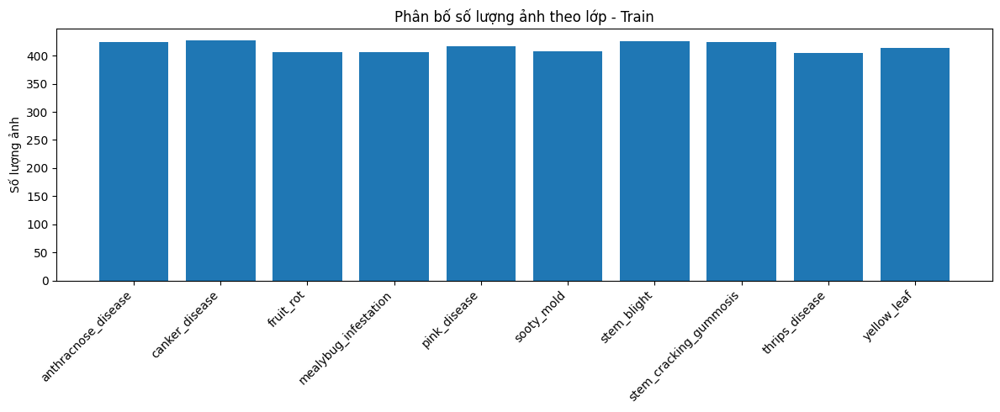

In [ ]:
import os
import matplotlib.pyplot as plt

classes_sorted = sorted([
    d for d in os.listdir(TRAIN_DIR)
    if os.path.isdir(os.path.join(TRAIN_DIR, d))
    and not d.startswith(".")
])

counts = [
    sum(
        1 for f in os.listdir(os.path.join(TRAIN_DIR, cls))
        if os.path.isfile(os.path.join(TRAIN_DIR, cls, f))
        and os.path.splitext(f)[1].lower() in VALID_EXTENSIONS
    )
    for cls in classes_sorted
]

plt.figure(figsize=(12, 5))
plt.bar(classes_sorted, counts)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Số lượng ảnh")
plt.title("Phân bố số lượng ảnh theo lớp - Train")
plt.tight_layout()
plt.show()

## 5b. Trực quan hoá phân bố dữ liệu (EDA)

Tổng hợp lại thành biểu đồ để trả lời trực tiếp câu hỏi "input đầu vào đạt yêu cầu chưa":
1. **Phân bố số lượng ảnh theo lớp/tập** (biểu đồ cột) + **tỉ lệ mất cân bằng lớp** (max/min trên tập train).
2. **Tỉ lệ chia tập THỰC TẾ** so với 70/15/15 kỳ vọng (Mục 6 có thể làm lệch tỉ lệ này nếu phải xoá leakage — xem cảnh báo ở Mục 6).
3. **Phân bố kích thước ảnh** (width/height) — đối chiếu với `config.IMG_SIZE` dùng khi resize cho model.

Lưu cả 2 biểu đồ vào `outputs/eda_*.png` để đưa vào báo cáo.


Số lớp: 10
['anthracnose_disease', 'canker_disease', 'fruit_rot', 'mealybug_infestation', 'pink_disease', 'sooty_mold', 'stem_blight', 'stem_cracking_gummosis', 'thrips_disease', 'yellow_leaf']


,train,validation,test
class,,,
anthracnose_disease,424,62,63
canker_disease,427,65,65
fruit_rot,406,61,61
mealybug_infestation,406,65,65
pink_disease,416,65,68
sooty_mold,407,68,66
stem_blight,426,64,64
stem_cracking_gummosis,424,68,68
thrips_disease,405,66,66



Tổng số ảnh theo tập:
  train     : 4154
  validation:  649
  test      :  648

Tổng dataset: 5451

Tỉ lệ mất cân bằng lớp (train, max/min): 1.05x
  Nhiều nhất: canker_disease = 427
  Ít nhất   : thrips_disease = 405
-> Mức mất cân bằng nhẹ, không đáng kể.

Phân bố tập dữ liệu gốc:
  train     : 4154 ảnh (76.2%)
  validation:  649 ảnh (11.9%)
  test      :  648 ảnh (11.9%)

✓ Giữ nguyên phân chia train/validation/test của dataset gốc.


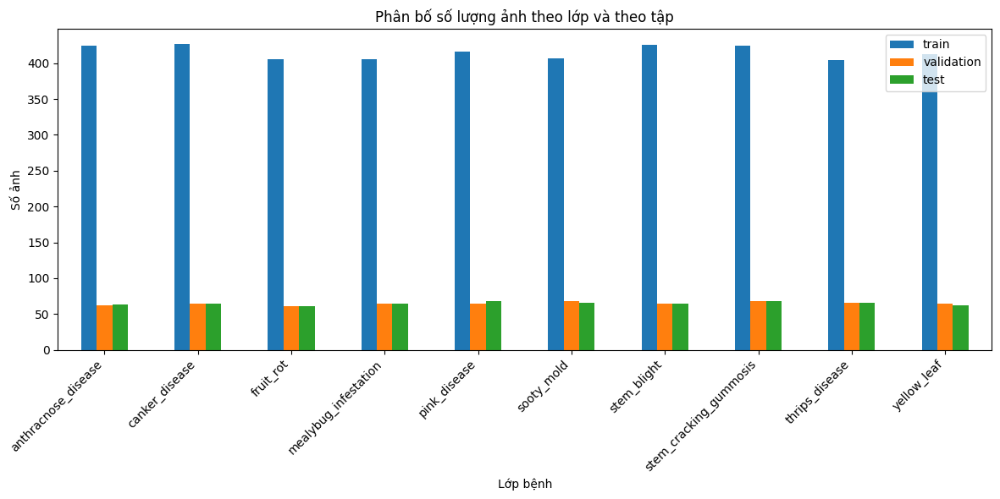

✓ Đã lưu: /content/drive/MyDrive/durian_leaf/outputs/eda_class_distribution.png

✓ Tìm thấy cache xác minh dataset.
Đang lấy mẫu kích thước ảnh cho EDA...

Số ảnh dùng phân tích kích thước: 2297
Width : min=150, median=764, max=1824
Height: min=150, median=642, max=1384


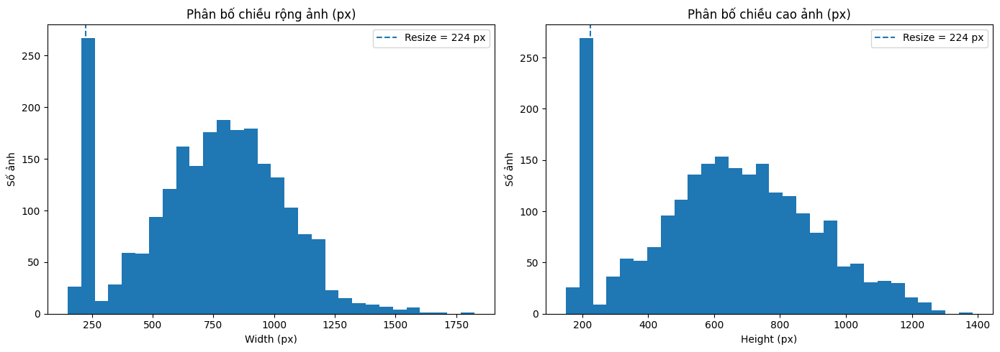

✓ Đã lưu: /content/drive/MyDrive/durian_leaf/outputs/eda_image_size_distribution.png

KẾT LUẬN EDA
Số lớp       : 10
Train        : 4154
Validation   : 649
Test         : 648
Tổng dataset : 5451

Kích thước đầu vào CNN: 224x224
Ảnh gốc có thể có nhiều kích thước khác nhau, do đó ảnh được resize về 224x224 trước khi đưa vào CNN.

✓ Hoàn thành EDA dataset gốc.


In [ ]:
# ============================================================
# EDA — PHÂN TÍCH DATASET GỐC
# ============================================================

import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# ------------------------------------------------------------
# 0. CẤU HÌNH
# ------------------------------------------------------------

# Đã được khai báo ở Setup:
# PROJECT_DIR
# TRAIN_DIR
# VAL_DIR
# TEST_DIR

OUTPUT_DIR = os.path.join(PROJECT_DIR, "outputs")
os.makedirs(OUTPUT_DIR, exist_ok=True)

VALID_EXTENSIONS = {
    ".jpg", ".jpeg", ".png", ".bmp", ".webp"
}

# Kích thước input thống nhất của 3 CNN
IMG_SIZE = (224, 224)

assert os.path.isdir(TRAIN_DIR), f"Không tìm thấy: {TRAIN_DIR}"
assert os.path.isdir(VAL_DIR),   f"Không tìm thấy: {VAL_DIR}"
assert os.path.isdir(TEST_DIR),  f"Không tìm thấy: {TEST_DIR}"


# ============================================================
# 1. DANH SÁCH LỚP
# ============================================================

all_classes = sorted(set(
    cls
    for split_dir in [TRAIN_DIR, VAL_DIR, TEST_DIR]
    for cls in os.listdir(split_dir)
    if (
        os.path.isdir(os.path.join(split_dir, cls))
        and not cls.startswith(".")
    )
))

print(f"Số lớp: {len(all_classes)}")
print(all_classes)

if len(all_classes) != 10:
    print(f"[!] Dataset hiện có {len(all_classes)} lớp, kỳ vọng 10 lớp.")


# ============================================================
# 2. ĐẾM SỐ ẢNH THEO LỚP / SPLIT
# ============================================================

splits = {
    "train": TRAIN_DIR,
    "validation": VAL_DIR,
    "test": TEST_DIR
}

counts = {}

for split, split_dir in splits.items():

    counts[split] = {}

    for cls in all_classes:

        cls_dir = os.path.join(split_dir, cls)

        if not os.path.isdir(cls_dir):
            counts[split][cls] = 0
            continue

        n = sum(
            1
            for fname in os.listdir(cls_dir)
            if (
                not fname.startswith(".")
                and os.path.isfile(os.path.join(cls_dir, fname))
                and os.path.splitext(fname)[1].lower()
                in VALID_EXTENSIONS
            )
        )

        counts[split][cls] = n


df_counts = pd.DataFrame(counts)
df_counts.index.name = "class"

display(df_counts)


# ============================================================
# 3. TỔNG SỐ ẢNH
# ============================================================

totals = df_counts[
    ["train", "validation", "test"]
].sum()

grand_total = int(totals.sum())

print("\nTổng số ảnh theo tập:")

for split in ["train", "validation", "test"]:
    print(f"  {split:10s}: {int(totals[split]):4d}")

print(f"\nTổng dataset: {grand_total}")


# ============================================================
# 4. MẤT CÂN BẰNG LỚP
# ============================================================

train_counts = df_counts["train"]

if train_counts.max() == 0:

    print("\n[!] Không đếm được ảnh train.")

elif train_counts.min() == 0:

    zero_classes = train_counts[
        train_counts == 0
    ].index.tolist()

    print(
        "\n[!] Có lớp không có ảnh train:",
        zero_classes
    )

else:

    max_count = int(train_counts.max())
    min_count = int(train_counts.min())

    max_class = train_counts.idxmax()
    min_class = train_counts.idxmin()

    imbalance_ratio = max_count / min_count

    print(
        "\nTỉ lệ mất cân bằng lớp "
        f"(train, max/min): {imbalance_ratio:.2f}x"
    )

    print(
        f"  Nhiều nhất: {max_class} = {max_count}"
    )

    print(
        f"  Ít nhất   : {min_class} = {min_count}"
    )

    if imbalance_ratio >= 1.5:
        print(
            "-> Dataset có mức mất cân bằng đáng kể."
        )
    else:
        print(
            "-> Mức mất cân bằng nhẹ, "
            "không đáng kể."
        )


# ============================================================
# 5. PHÂN BỐ TRAIN / VALIDATION / TEST
# ============================================================

print("\nPhân bố tập dữ liệu gốc:")

for split in ["train", "validation", "test"]:

    n = int(totals[split])
    pct = 100 * n / grand_total

    print(
        f"  {split:10s}: "
        f"{n:4d} ảnh ({pct:.1f}%)"
    )

print(
    "\n✓ Giữ nguyên phân chia "
    "train/validation/test của dataset gốc."
)


# ============================================================
# 6. BIỂU ĐỒ PHÂN BỐ LỚP
# ============================================================

fig, ax = plt.subplots(figsize=(12, 6))

df_counts[
    ["train", "validation", "test"]
].plot(
    kind="bar",
    ax=ax
)

ax.set_title(
    "Phân bố số lượng ảnh theo lớp và theo tập"
)

ax.set_ylabel("Số ảnh")
ax.set_xlabel("Lớp bệnh")

plt.xticks(
    rotation=45,
    ha="right"
)

plt.tight_layout()

class_distribution_path = os.path.join(
    OUTPUT_DIR,
    "eda_class_distribution.png"
)

plt.savefig(
    class_distribution_path,
    dpi=120,
    bbox_inches="tight"
)

plt.show()

print(
    "✓ Đã lưu:",
    class_distribution_path
)


# ============================================================
# 7. KÍCH THƯỚC ẢNH
# ============================================================

widths = []
heights = []

# ------------------------------------------------------------
# Ưu tiên dữ liệu đã quét trước đó
# ------------------------------------------------------------

if (
    "all_reports" in globals()
    and isinstance(all_reports, dict)
    and any(
        r.get("sizes")
        for r in all_reports.values()
    )
):

    print(
        "\n✓ Sử dụng kết quả kích thước ảnh "
        "đã quét trước đó."
    )

    for report in all_reports.values():

        for size in report.get("sizes", []):

            widths.append(size[0])
            heights.append(size[1])

else:

    # --------------------------------------------------------
    # Thử đọc cache dataset_verification.json
    # --------------------------------------------------------

    cache_file = os.path.join(
        OUTPUT_DIR,
        "dataset_verification.json"
    )

    cache_used = False

    if os.path.isfile(cache_file):

        try:

            with open(
                cache_file,
                "r",
                encoding="utf-8"
            ) as f:

                verification = json.load(f)

            # Cache hiện tại chỉ có min/max,
            # không đủ để dựng histogram đầy đủ.
            # Vì vậy chỉ thông báo, sau đó lấy mẫu ảnh.

            print(
                "\n✓ Tìm thấy cache xác minh dataset."
            )

        except Exception:
            pass

    # --------------------------------------------------------
    # Không quét toàn bộ 5.451 ảnh lần nữa.
    # Lấy tối đa 100 ảnh / lớp / split để EDA kích thước.
    # --------------------------------------------------------

    print(
        "Đang lấy mẫu kích thước ảnh cho EDA..."
    )

    MAX_IMAGES_PER_CLASS = 100

    for split_dir in [
        TRAIN_DIR,
        VAL_DIR,
        TEST_DIR
    ]:

        for cls in all_classes:

            cls_dir = os.path.join(
                split_dir,
                cls
            )

            if not os.path.isdir(cls_dir):
                continue

            files = sorted([
                f
                for f in os.listdir(cls_dir)
                if (
                    not f.startswith(".")
                    and os.path.isfile(
                        os.path.join(cls_dir, f)
                    )
                    and os.path.splitext(f)[1].lower()
                    in VALID_EXTENSIONS
                )
            ])

            for fname in files[
                :MAX_IMAGES_PER_CLASS
            ]:

                path = os.path.join(
                    cls_dir,
                    fname
                )

                try:

                    with Image.open(path) as img:

                        w, h = img.size

                    widths.append(w)
                    heights.append(h)

                except Exception:
                    pass


# ============================================================
# 8. BIỂU ĐỒ KÍCH THƯỚC ẢNH
# ============================================================

if widths and heights:

    print(
        f"\nSố ảnh dùng phân tích kích thước: "
        f"{len(widths)}"
    )

    print(
        f"Width : min={min(widths)}, "
        f"median={np.median(widths):.0f}, "
        f"max={max(widths)}"
    )

    print(
        f"Height: min={min(heights)}, "
        f"median={np.median(heights):.0f}, "
        f"max={max(heights)}"
    )

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(14, 5)
    )

    # Width
    axes[0].hist(
        widths,
        bins=30
    )

    axes[0].set_title(
        "Phân bố chiều rộng ảnh (px)"
    )

    axes[0].set_xlabel("Width (px)")
    axes[0].set_ylabel("Số ảnh")

    axes[0].axvline(
        IMG_SIZE[0],
        linestyle="--",
        label=f"Resize = {IMG_SIZE[0]} px"
    )

    axes[0].legend()

    # Height
    axes[1].hist(
        heights,
        bins=30
    )

    axes[1].set_title(
        "Phân bố chiều cao ảnh (px)"
    )

    axes[1].set_xlabel("Height (px)")
    axes[1].set_ylabel("Số ảnh")

    axes[1].axvline(
        IMG_SIZE[1],
        linestyle="--",
        label=f"Resize = {IMG_SIZE[1]} px"
    )

    axes[1].legend()

    plt.tight_layout()

    size_distribution_path = os.path.join(
        OUTPUT_DIR,
        "eda_image_size_distribution.png"
    )

    plt.savefig(
        size_distribution_path,
        dpi=120,
        bbox_inches="tight"
    )

    plt.show()

    print(
        "✓ Đã lưu:",
        size_distribution_path
    )

else:

    print(
        "\n[!] Không thu được thông tin "
        "kích thước ảnh."
    )


# ============================================================
# 9. KẾT LUẬN EDA
# ============================================================

print("\n" + "=" * 60)
print("KẾT LUẬN EDA")
print("=" * 60)

print(f"Số lớp       : {len(all_classes)}")
print(f"Train        : {int(totals['train'])}")
print(f"Validation   : {int(totals['validation'])}")
print(f"Test         : {int(totals['test'])}")
print(f"Tổng dataset : {grand_total}")

print(
    f"\nKích thước đầu vào CNN: "
    f"{IMG_SIZE[0]}x{IMG_SIZE[1]}"
)

print(
    "Ảnh gốc có thể có nhiều kích thước khác nhau, "
    "do đó ảnh được resize về 224x224 "
    "trước khi đưa vào CNN."
)

print(
    "\n✓ Hoàn thành EDA dataset gốc."
)

### 6. 🟠 Chuẩn hóa dataset 10 class


1. Đổi tên thư mục lớp về đúng **10 tên chuẩn** (danh sách cố định — nguồn chân lý duy nhất).
2. Báo lỗi rõ ràng nếu có thư mục lạ không nhận diện được, để kiểm tra thủ công thay vì âm thầm bỏ qua.
3. **Tự động ghi `CLASS_NAMES` vào `config.py`** — không cần copy tay như trước, tránh lệch giữa dữ liệu thực tế và cấu hình.


In [ ]:
# ============================================================
# VALIDATE 10 CLASS — không rename/move/delete dataset
# ============================================================
expected = set(CANONICAL_CLASS_NAMES)
SPLIT_DIRS = {"train": TRAIN_DIR, "validation": VAL_DIR, "test": TEST_DIR}

for split, split_dir in SPLIT_DIRS.items():
    actual = {
        d for d in os.listdir(split_dir)
        if not d.startswith(".") and os.path.isdir(os.path.join(split_dir, d))
    }
    missing = expected - actual
    extra = actual - expected
    if missing or extra:
        raise ValueError(
            f"{split}: thiếu={sorted(missing)}, thừa={sorted(extra)}"
        )
    print(f"✓ {split:10s}: 10/10 class hợp lệ")

print("\n✓ Dataset giữ nguyên, không rename/move/delete dữ liệu.")


✓ train     : 10/10 class hợp lệ
✓ validation: 10/10 class hợp lệ
✓ test      : 10/10 class hợp lệ

✓ Dataset giữ nguyên, không rename/move/delete dữ liệu.


## 7. 🟠 Preprocessing + augmentation chính thức

Pipeline này dùng cho **3 mô hình Transfer Learning và các ablation**.

- **Train:** resize + preprocessing theo backbone + augmentation.
- **Validation/Test:** resize + preprocessing theo backbone, **không augmentation**.
- Augmentation không tạo thêm mẫu độc lập cho validation/test và không được dùng để
  "bù" số lượng ảnh đánh giá ít.
- Các phép biến đổi giữ ở mức nhẹ: flip, rotation, zoom, brightness/contrast nhằm mô
  phỏng thay đổi góc chụp/ánh sáng thực tế.

Ablation ở phần sau sẽ so sánh trực tiếp **có augmentation vs không augmentation**
để kiểm chứng augmentation có thực sự cải thiện generalization hay không.


In [ ]:
# ============================================================
# SOURCE SANITY CHECK
# ============================================================
import os, sys, importlib

if CODE_DIR not in sys.path:
    sys.path.insert(0, CODE_DIR)

required = ["config.py", "data_preparation.py", "models.py", "train.py"]
for filename in required:
    path = os.path.join(CODE_DIR, filename)
    if not os.path.isfile(path):
        raise FileNotFoundError(path)
    print("✓", path)

import data_preparation
import models

print("\n✓ Source imports OK.")


✓ /content/durian_leaf/durian_leaf/config.py
✓ /content/durian_leaf/durian_leaf/data_preparation.py
✓ /content/durian_leaf/durian_leaf/models.py
✓ /content/durian_leaf/durian_leaf/train.py

✓ Source imports OK.


Cấu hình:
  IMG_SIZE   = (224, 224)
  BATCH_SIZE = 32
  SEED       = 42
  CLASSES    = 10
✓ Augmentation source: /content/durian_leaf/durian_leaf/data_preparation.py
Found 4154 files belonging to 10 classes.


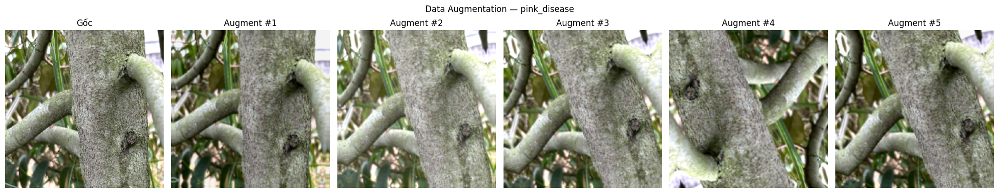

✓ Đã lưu: /content/drive/MyDrive/durian_leaf/outputs/augmentation_preview.png


In [ ]:
# ============================================================
# PREPROCESSING + DATA AUGMENTATION CHÍNH THỨC
# ============================================================
import importlib
import tensorflow as tf
import matplotlib.pyplot as plt
import data_preparation

importlib.reload(data_preparation)
from data_preparation import build_augmentation_pipeline

AUGMENTATION_LAYERS = build_augmentation_pipeline()

def make_dataset(directory, shuffle=False, augment=False):
    ds = tf.keras.utils.image_dataset_from_directory(
        directory,
        labels="inferred",
        label_mode="categorical",
        class_names=CANONICAL_CLASS_NAMES,
        image_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        shuffle=shuffle,
        seed=SEED,
    )
    if augment:
        ds = ds.map(
            lambda x, y: (AUGMENTATION_LAYERS(x, training=True), y),
            num_parallel_calls=tf.data.AUTOTUNE,
        )
    return ds.prefetch(tf.data.AUTOTUNE)

print("Cấu hình:")
print("  IMG_SIZE   =", IMG_SIZE)
print("  BATCH_SIZE =", BATCH_SIZE)
print("  SEED       =", SEED)
print("  CLASSES    =", len(CANONICAL_CLASS_NAMES))
print("✓ Augmentation source:", data_preparation.__file__)

sample_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    labels="inferred",
    label_mode="categorical",
    class_names=CANONICAL_CLASS_NAMES,
    image_size=IMG_SIZE,
    batch_size=1,
    shuffle=True,
    seed=SEED,
)

sample_img, sample_label = next(iter(sample_ds.take(1)))
class_name = CANONICAL_CLASS_NAMES[int(tf.argmax(sample_label[0]).numpy())]

fig, axes = plt.subplots(1, 6, figsize=(20, 4))
axes[0].imshow(tf.clip_by_value(sample_img[0], 0, 255).numpy().astype("uint8"))
axes[0].set_title("Gốc")
axes[0].axis("off")

for i in range(1, 6):
    augmented = AUGMENTATION_LAYERS(sample_img, training=True)
    axes[i].imshow(tf.clip_by_value(augmented[0], 0, 255).numpy().astype("uint8"))
    axes[i].set_title(f"Augment #{i}")
    axes[i].axis("off")

plt.suptitle(f"Data Augmentation — {class_name}")
plt.tight_layout()

augmentation_path = os.path.join(OUTPUT_DIR, "augmentation_preview.png")
plt.savefig(augmentation_path, dpi=120, bbox_inches="tight")
plt.show()

print("✓ Đã lưu:", augmentation_path)


## 8b. Kết nối `outputs/` và `saved_models/` với Drive

Để kết quả (model đã train, biểu đồ, báo cáo) không bị mất khi Colab ngắt kết nối

In [ ]:
import os, shutil

for name in ["outputs", "saved_models"]:
    local_path = os.path.join(CODE_DIR, name)
    drive_path = os.path.join(PROJECT_DIR, name)
    os.makedirs(drive_path, exist_ok=True)
    if os.path.islink(local_path):
        os.remove(local_path)
    elif os.path.isdir(local_path):
        # merge nội dung cũ (nếu có) vào Drive trước khi thay bằng symlink
        for item in os.listdir(local_path):
            s, d = os.path.join(local_path, item), os.path.join(drive_path, item)
            if not os.path.exists(d):
                shutil.move(s, d)
        shutil.rmtree(local_path)
    os.symlink(drive_path, local_path)
    print(f"{name}/  ->  {drive_path}")


outputs/  ->  /content/drive/MyDrive/durian_leaf/outputs
saved_models/  ->  /content/drive/MyDrive/durian_leaf/saved_models


## 8c. Resume-safe cache & provenance

Checkpoint/kết quả được lưu trên Google Drive.


In [ ]:
import os, json, hashlib
from pathlib import Path

CACHE_DIR = os.path.join(PROJECT_DIR, "cache")
ABLATION_MODEL_DIR = os.path.join(PROJECT_DIR, "saved_models", "ablation")
ABLATION_OUTPUT_DIR = os.path.join(PROJECT_DIR, "outputs", "ablation")
os.makedirs(CACHE_DIR, exist_ok=True)
os.makedirs(ABLATION_MODEL_DIR, exist_ok=True)
os.makedirs(ABLATION_OUTPUT_DIR, exist_ok=True)

FORCE = {
    "main_train": False,
    "evaluate": False,
    "ablation_1": False,
    "ablation_2": False,
    "gradcam": False,
}

def dataset_fingerprint():
    h = hashlib.sha256()
    n = 0
    for split in ("train", "validation", "test"):
        root = Path(DATA_DIR) / split
        for p in sorted(x for x in root.rglob("*")
                        if x.is_file() and x.suffix.lower() in VALID_EXTENSIONS):
            st = p.stat()
            rel = p.relative_to(DATA_DIR).as_posix()
            h.update(f"{rel}|{st.st_size}\n".encode())
            n += 1
    return h.hexdigest(), n

DATASET_FINGERPRINT, DATASET_TOTAL = dataset_fingerprint()
if DATASET_TOTAL != 5451:
    raise RuntimeError(f"Resume-safe guard: dataset={DATASET_TOTAL}, expected=5451")

def config_fingerprint(payload):
    return hashlib.sha256(
        json.dumps(payload, sort_keys=True, ensure_ascii=False).encode()
    ).hexdigest()

def load_json(path):
    with open(path, encoding="utf-8") as f:
        return json.load(f)

def save_json(path, obj):
    Path(path).parent.mkdir(parents=True, exist_ok=True)
    with open(path, "w", encoding="utf-8") as f:
        json.dump(obj, f, indent=2, ensure_ascii=False)

def artifact_valid(meta_path, experiment, cfg_fp):
    if not os.path.exists(meta_path):
        return False
    try:
        m = load_json(meta_path)
        return (
            m.get("dataset_total") == 5451
            and m.get("dataset_fingerprint") == DATASET_FINGERPRINT
            and m.get("experiment") == experiment
            and m.get("config_fingerprint") == cfg_fp
        )
    except Exception:
        return False

print("✓ Resume-safe initialized")
print("dataset_total:", DATASET_TOTAL)
print("dataset fingerprint:", DATASET_FINGERPRINT[:16] + "...")
print("FORCE:", FORCE)


✓ Resume-safe initialized
dataset_total: 5451
dataset fingerprint: 4b3944a68a35863b...
FORCE: {'main_train': False, 'evaluate': False, 'ablation_1': False, 'ablation_2': False, 'gradcam': False}


## 8c. Các phép biến đổi cơ bản trên ảnh

Minh họa các thao tác nền tảng của xử lý ảnh trước khi trích xuất đặc trưng và huấn luyện mô hình.

**Hình học:** resize, flip, rotation, center crop.  
**Cường độ/biên:** RGB→gray, Gaussian blur, CLAHE, Otsu threshold, Canny, morphological closing.



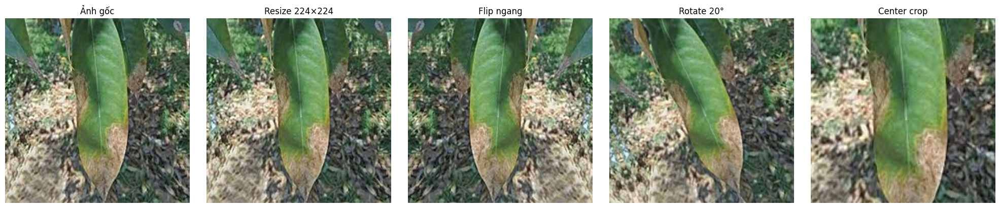

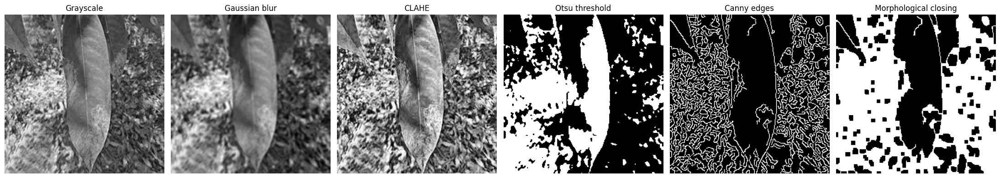

Ảnh minh họa: /content/drive/MyDrive/durian_leaf/data/Durian_Diseases/train/anthracnose_disease/093.jpg


In [ ]:
import cv2, glob, os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

_candidates=[]
for cls in CANONICAL_CLASS_NAMES:
    _candidates += sorted(glob.glob(os.path.join(TRAIN_DIR, cls, '*')))
sample_transform_path = next(p for p in _candidates if os.path.isfile(p) and os.path.splitext(p)[1].lower() in VALID_EXTENSIONS)
img_rgb=np.array(Image.open(sample_transform_path).convert('RGB'))
h,w=img_rgb.shape[:2]
resized=cv2.resize(img_rgb,(224,224)); flipped=cv2.flip(img_rgb,1)
M=cv2.getRotationMatrix2D((w/2,h/2),20,1.0)
rotated=cv2.warpAffine(img_rgb,M,(w,h),flags=cv2.INTER_LINEAR,borderMode=cv2.BORDER_REFLECT)
cs=int(min(h,w)*0.70); y0=(h-cs)//2; x0=(w-cs)//2; crop=img_rgb[y0:y0+cs,x0:x0+cs]
fig,axes=plt.subplots(1,5,figsize=(20,4))
for ax,im,title in zip(axes,[img_rgb,resized,flipped,rotated,crop],['Ảnh gốc','Resize 224×224','Flip ngang','Rotate 20°','Center crop']):
    ax.imshow(im); ax.set_title(title); ax.axis('off')
plt.tight_layout(); os.makedirs(OUTPUT_DIR,exist_ok=True); plt.savefig(os.path.join(OUTPUT_DIR,'basic_geometric_transforms.png'),dpi=150,bbox_inches='tight'); plt.show()

gray=cv2.cvtColor(img_rgb,cv2.COLOR_RGB2GRAY); blur=cv2.GaussianBlur(gray,(5,5),0)
clahe=cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8)).apply(gray)
_,otsu=cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
edges=cv2.Canny(blur,50,150); closing=cv2.morphologyEx(edges,cv2.MORPH_CLOSE,np.ones((5,5),np.uint8))
fig,axes=plt.subplots(1,6,figsize=(22,4))
for ax,im,title in zip(axes,[gray,blur,clahe,otsu,edges,closing],['Grayscale','Gaussian blur','CLAHE','Otsu threshold','Canny edges','Morphological closing']):
    ax.imshow(im,cmap='gray'); ax.set_title(title); ax.axis('off')
plt.tight_layout(); plt.savefig(os.path.join(OUTPUT_DIR,'basic_intensity_edge_transforms.png'),dpi=150,bbox_inches='tight'); plt.show()
print('Ảnh minh họa:',sample_transform_path)


## 9. Histogram

- Chuyển ảnh từ RGB/BGR sang **HSV**.
- Tính histogram 3 chiều trên các kênh H, S, V.
- Chuẩn hóa histogram để có thể so sánh giữa các ảnh.
- Histogram được dùng để **phân tích đặc trưng màu**.



In [ ]:
import os, glob, cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

HIST_BINS = 8

def hsv_histogram(image_path, bins=HIST_BINS):
    """Histogram HSV 3D, tương tự hướng tiếp cận của Lab Histogram."""
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Không đọc được ảnh: {image_path}")

    img = cv2.resize(img, tuple(IMG_SIZE))
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    hist = cv2.calcHist(
        [hsv], [0, 1, 2], None,
        [bins, bins, bins],
        [0, 180, 0, 256, 0, 256]
    )
    hist = cv2.normalize(hist, hist).flatten()
    return hist

# Lấy một số ảnh mỗi lớp để phân tích histogram
HIST_IMAGES_PER_CLASS = 50
class_histograms = {}

for cls in CANONICAL_CLASS_NAMES:
    files = sorted(
        p for p in glob.glob(os.path.join(TRAIN_DIR, cls, "*"))
        if os.path.isfile(p)
    )[:HIST_IMAGES_PER_CLASS]

    if not files:
        continue

    hists = np.stack([hsv_histogram(p) for p in files])
    class_histograms[cls] = hists.mean(axis=0)

print("Số lớp có histogram:", len(class_histograms))
print("Kích thước vector histogram:", HIST_BINS ** 3)


Số lớp có histogram: 10
Kích thước vector histogram: 512


### 9.1 Trực quan hóa Histogram HSV theo lớp

 Mục đích là quan sát sự khác biệt về phân bố màu giữa các nhóm bệnh/hại trước khi chuyển sang mô hình học sâu.


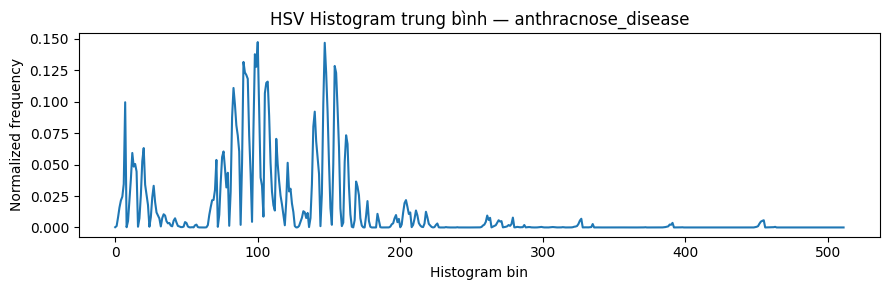

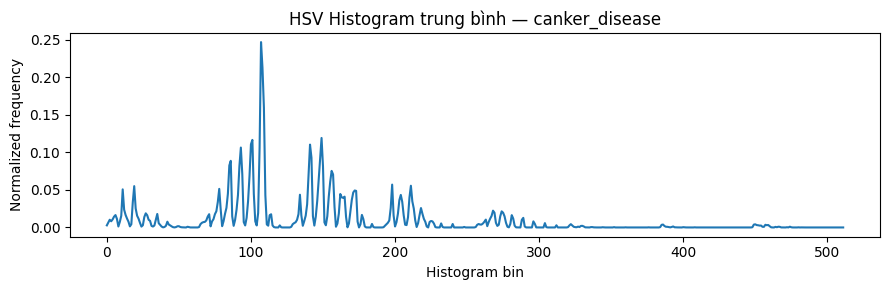

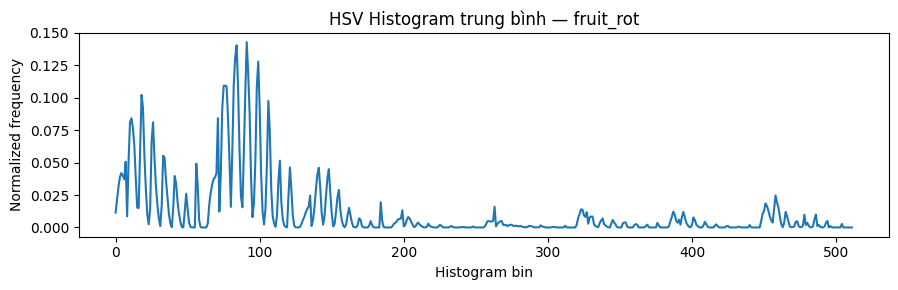

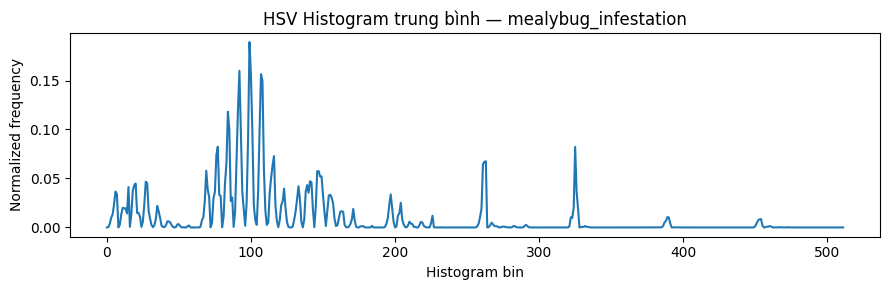

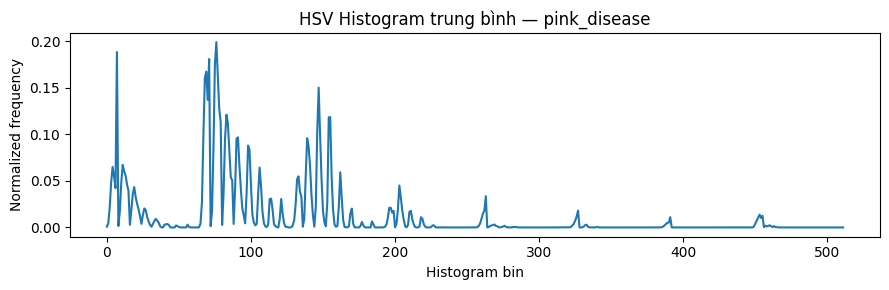

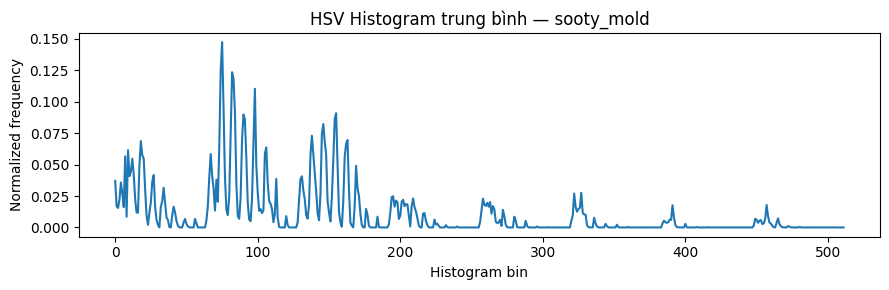

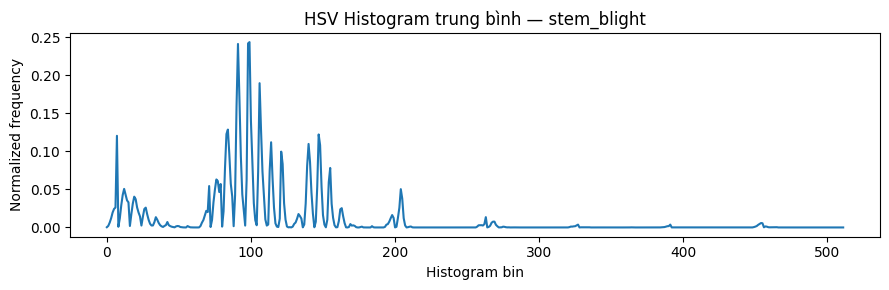

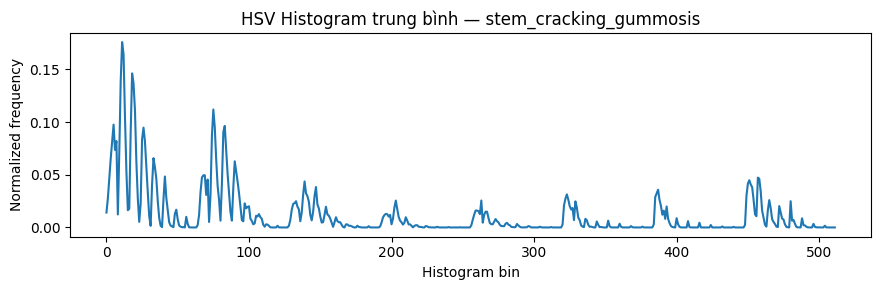

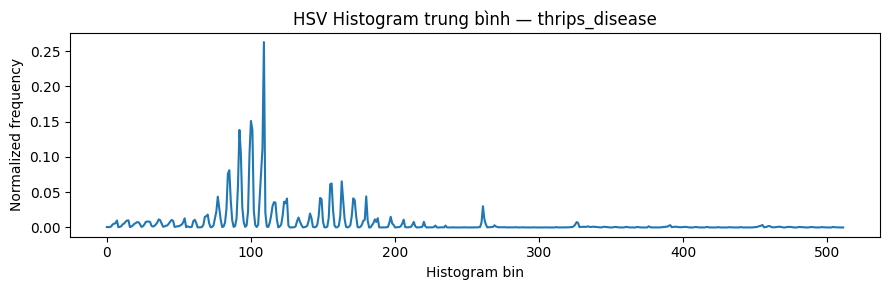

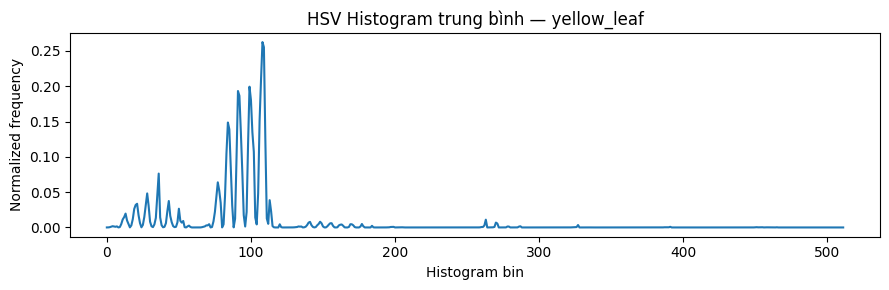

In [ ]:
for cls, hist in class_histograms.items():
    plt.figure(figsize=(9, 3))
    plt.plot(hist)
    plt.title(f"HSV Histogram trung bình — {cls}")
    plt.xlabel("Histogram bin")
    plt.ylabel("Normalized frequency")
    plt.tight_layout()
    plt.show()


### 9.2 Diễn giải cho báo cáo

Histogram mô tả **đặc trưng màu toàn cục** của ảnh.

 Các triệu chứng như vàng lá, nâu hóa, vùng hoại tử hoặc mốc có thể làm thay đổi phân bố màu.

 Tuy nhiên Histogram không mô tả tốt vị trí không gian của tổn thương,
  vì vậy phần phân loại chính của đồ án sử dụng CNN/Transfer Learning để học đặc trưng phức tạp hơn.


## 10. Huấn luyện 3 kiến trúc CNN (Transfer Learning, 2 giai đoạn)


In [ ]:
# ============================================================
# HARD GUARD BEFORE TRAINING — DISTRIBUTED DATASET 5,451 IMAGES
# ============================================================

import os
from pathlib import Path

# Dataset thực tế trong Durian_Diseases.zip
# Published description: 5,452
# Distributed archive:   5,451 = 4,154 + 649 + 648
EXPECTED_DISTRIBUTED_TOTAL = 5451
PUBLISHED_TOTAL = 5452

EXPECTED_SPLIT = {
    "train": 4154,
    "validation": 649,
    "test": 648,
}

# Lấy đường dẫn từ config sau khi source/config đã được chuẩn bị
split_dirs = {
    "train": Path(TRAIN_DIR),
    "validation": Path(VAL_DIR),
    "test": Path(TEST_DIR),
}

# ------------------------------------------------------------
# 1. Đếm số ảnh thực tế
# ------------------------------------------------------------
split_counts = {}

for name, d in split_dirs.items():

    if not d.exists():
        raise FileNotFoundError(
            f"Thiếu split {name}: {d}"
        )

    split_counts[name] = len([
        p for p in d.rglob("*")
        if (
            p.is_file()
            and p.suffix.lower() in VALID_IMAGE_EXTS
            and "__MACOSX" not in p.parts
        )
    ])

total_processed = sum(split_counts.values())

# ------------------------------------------------------------
# 2. Hiển thị reconciliation
# ------------------------------------------------------------
print("Dataset dùng cho experiment:")

for k, v in split_counts.items():
    print(f"  {k:10s}: {v:,}")

print(f"  {'TOTAL':10s}: {total_processed:,}")
print(f"  EXPECTED   : {EXPECTED_DISTRIBUTED_TOTAL:,}")
print(f"  PUBLISHED  : {PUBLISHED_TOTAL:,}")

# ------------------------------------------------------------
# 3. HARD GUARD — kiểm tra từng split
# ------------------------------------------------------------
if split_counts != EXPECTED_SPLIT:

    raise RuntimeError(
        "STOP TRAINING: số lượng ảnh của các split không đúng.\n"
        f"Actual   : {split_counts}\n"
        f"Expected : {EXPECTED_SPLIT}"
    )

# ------------------------------------------------------------
# 4. HARD GUARD — kiểm tra tổng
# ------------------------------------------------------------
if total_processed != EXPECTED_DISTRIBUTED_TOTAL:

    raise RuntimeError(
        f"STOP TRAINING: dataset hiện có {total_processed:,} ảnh, "
        f"expected {EXPECTED_DISTRIBUTED_TOTAL:,} ảnh theo "
        "distributed archive."
    )

# ------------------------------------------------------------
# 5. Không cho phép ảnh corrupt bị bỏ qua âm thầm
# ------------------------------------------------------------
all_paths = []

for d in split_dirs.values():
    all_paths.extend(list_images(d))

bad = verify_readable(all_paths)

if bad:

    print("\nẢnh không đọc được:")

    for x in bad[:20]:
        print(" -", x)

    raise RuntimeError(
        f"STOP TRAINING: phát hiện {len(bad)} ảnh không đọc được. "
        "Hãy kiểm tra nguồn dữ liệu thay vì tự động xóa."
    )

# ------------------------------------------------------------
# 6. PASS
# ------------------------------------------------------------
print("\n✓ HARD GUARD PASSED")
print("✓ Dataset thực nghiệm: 5,451 ảnh")
print("✓ Train      : 4,154")
print("✓ Validation : 649")
print("✓ Test       : 648")
print("✓ Tất cả ảnh đều đọc được.")
print()
print(
    "Ghi chú: mô tả dataset công bố 5,452 ảnh, "
    "nhưng distributed archive sử dụng trong experiment "
    "chứa 5,451 ảnh hợp lệ (chênh 1 ảnh validation)."
)
print()
print("✓ Có thể bắt đầu EDA / training / evaluation.")

Dataset dùng cho experiment:
  train     : 4,154
  validation: 649
  test      : 648
  TOTAL     : 5,451
  EXPECTED   : 5,451
  PUBLISHED  : 5,452

✓ HARD GUARD PASSED
✓ Dataset thực nghiệm: 5,451 ảnh
✓ Train      : 4,154
✓ Validation : 649
✓ Test       : 648
✓ Tất cả ảnh đều đọc được.

Ghi chú: mô tả dataset công bố 5,452 ảnh, nhưng distributed archive sử dụng trong experiment chứa 5,451 ảnh hợp lệ (chênh 1 ảnh validation).

✓ Có thể bắt đầu EDA / training / evaluation.


In [ ]:
import os, subprocess, sys

MODEL_NAME = "efficientnet"
best_path = os.path.join(MODEL_DIR, f"{MODEL_NAME}_best.keras")
final_path = os.path.join(MODEL_DIR, f"{MODEL_NAME}_final.keras")
meta_path = os.path.join(OUTPUT_DIR, f"{MODEL_NAME}_resume_metadata.json")

train_cfg = {
    "model": MODEL_NAME,
    "epochs": int(EPOCHS_HEAD + EPOCHS_FINE_TUNE),
    "batch_size": int(BATCH_SIZE),
    "use_class_weights": True,
    "img_size": list(IMG_SIZE),
    "seed": int(SEED),
}
cfg_fp = config_fingerprint(train_cfg)

valid = (
    os.path.isfile(best_path)
    and os.path.isfile(final_path)
    and artifact_valid(meta_path, f"main_train:{MODEL_NAME}", cfg_fp)
)

if valid and not FORCE["main_train"]:
    print(f"✓ {MODEL_NAME}: checkpoint hợp lệ -> SKIP TRAIN")
else:
    subprocess.run(
        [
            sys.executable,
            os.path.join(CODE_DIR, "train.py"),
            "--model", MODEL_NAME,
            "--epochs", str(EPOCHS_HEAD + EPOCHS_FINE_TUNE),
            "--batch_size", str(BATCH_SIZE),
            "--use_class_weights",
        ],
        cwd=CODE_DIR,
        check=True,
        env=os.environ.copy(),
    )

    if not (os.path.isfile(best_path) and os.path.isfile(final_path)):
        raise RuntimeError(
            f"{MODEL_NAME}: train xong nhưng thiếu best/final checkpoint."
        )

    save_json(meta_path, {
        "experiment": f"main_train:{MODEL_NAME}",
        "dataset_total": 5451,
        "dataset_fingerprint": DATASET_FINGERPRINT,
        "config": train_cfg,
        "config_fingerprint": cfg_fp,
    })

    print(f"✓ {MODEL_NAME}: saved checkpoint + provenance")


✓ efficientnet: checkpoint hợp lệ -> SKIP TRAIN


In [ ]:
import os, subprocess, sys

MODEL_NAME = "resnet50"
best_path = os.path.join(MODEL_DIR, f"{MODEL_NAME}_best.keras")
final_path = os.path.join(MODEL_DIR, f"{MODEL_NAME}_final.keras")
meta_path = os.path.join(OUTPUT_DIR, f"{MODEL_NAME}_resume_metadata.json")

train_cfg = {
    "model": MODEL_NAME,
    "epochs": int(EPOCHS_HEAD + EPOCHS_FINE_TUNE),
    "batch_size": int(BATCH_SIZE),
    "use_class_weights": True,
    "img_size": list(IMG_SIZE),
    "seed": int(SEED),
}
cfg_fp = config_fingerprint(train_cfg)

valid = (
    os.path.isfile(best_path)
    and os.path.isfile(final_path)
    and artifact_valid(meta_path, f"main_train:{MODEL_NAME}", cfg_fp)
)

if valid and not FORCE["main_train"]:
    print(f"✓ {MODEL_NAME}: checkpoint hợp lệ -> SKIP TRAIN")
else:
    subprocess.run(
        [
            sys.executable,
            os.path.join(CODE_DIR, "train.py"),
            "--model", MODEL_NAME,
            "--epochs", str(EPOCHS_HEAD + EPOCHS_FINE_TUNE),
            "--batch_size", str(BATCH_SIZE),
            "--use_class_weights",
        ],
        cwd=CODE_DIR,
        check=True,
        env=os.environ.copy(),
    )

    if not (os.path.isfile(best_path) and os.path.isfile(final_path)):
        raise RuntimeError(
            f"{MODEL_NAME}: train xong nhưng thiếu best/final checkpoint."
        )

    save_json(meta_path, {
        "experiment": f"main_train:{MODEL_NAME}",
        "dataset_total": 5451,
        "dataset_fingerprint": DATASET_FINGERPRINT,
        "config": train_cfg,
        "config_fingerprint": cfg_fp,
    })

    print(f"✓ {MODEL_NAME}: saved checkpoint + provenance")


✓ resnet50: checkpoint hợp lệ -> SKIP TRAIN


In [ ]:
import os, subprocess, sys

MODEL_NAME = "mobilenet"
best_path = os.path.join(MODEL_DIR, f"{MODEL_NAME}_best.keras")
final_path = os.path.join(MODEL_DIR, f"{MODEL_NAME}_final.keras")
meta_path = os.path.join(OUTPUT_DIR, f"{MODEL_NAME}_resume_metadata.json")

train_cfg = {
    "model": MODEL_NAME,
    "epochs": int(EPOCHS_HEAD + EPOCHS_FINE_TUNE),
    "batch_size": int(BATCH_SIZE),
    "use_class_weights": True,
    "img_size": list(IMG_SIZE),
    "seed": int(SEED),
}
cfg_fp = config_fingerprint(train_cfg)

valid = (
    os.path.isfile(best_path)
    and os.path.isfile(final_path)
    and artifact_valid(meta_path, f"main_train:{MODEL_NAME}", cfg_fp)
)

if valid and not FORCE["main_train"]:
    print(f"✓ {MODEL_NAME}: checkpoint hợp lệ -> SKIP TRAIN")
else:
    subprocess.run(
        [
            sys.executable,
            os.path.join(CODE_DIR, "train.py"),
            "--model", MODEL_NAME,
            "--epochs", str(EPOCHS_HEAD + EPOCHS_FINE_TUNE),
            "--batch_size", str(BATCH_SIZE),
            "--use_class_weights",
        ],
        cwd=CODE_DIR,
        check=True,
        env=os.environ.copy(),
    )

    if not (os.path.isfile(best_path) and os.path.isfile(final_path)):
        raise RuntimeError(
            f"{MODEL_NAME}: train xong nhưng thiếu best/final checkpoint."
        )

    save_json(meta_path, {
        "experiment": f"main_train:{MODEL_NAME}",
        "dataset_total": 5451,
        "dataset_fingerprint": DATASET_FINGERPRINT,
        "config": train_cfg,
        "config_fingerprint": cfg_fp,
    })

    print(f"✓ {MODEL_NAME}: saved checkpoint + provenance")


✓ mobilenet: checkpoint hợp lệ -> SKIP TRAIN


## 11. Đánh giá & so sánh 3 model


In [ ]:
import os, sys, subprocess, json
import numpy as np
import tensorflow as tf
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

os.chdir(CODE_DIR)

REQUIRED_METRICS = {
    "accuracy", "macro_precision", "macro_recall", "macro_f1"
}

def _result_has_macro_metrics(path):
    if not os.path.exists(path):
        return False
    try:
        with open(path, "r", encoding="utf-8") as f:
            r = json.load(f)
        return REQUIRED_METRICS.issubset(r.keys())
    except Exception:
        return False

def _repair_macro_metrics(model_name, result_path):
    """
    evaluate.py cũ có thể chỉ ghi accuracy/precision/recall.
    Hàm này dùng checkpoint hiện có và test split 648 ảnh để tính đúng
    macro Precision/Recall/F1, rồi cập nhật JSON. KHÔNG train lại model.
    """
    best_path = os.path.join(MODEL_DIR, f"{model_name}_best.keras")
    final_path = os.path.join(MODEL_DIR, f"{model_name}_final.keras")

    if os.path.exists(best_path):
        model_path = best_path
    elif os.path.exists(final_path):
        model_path = final_path
    else:
        raise FileNotFoundError(
            f"Không tìm thấy checkpoint cho {model_name}: "
            f"{best_path} hoặc {final_path}"
        )

    print(f"→ Tính macro metrics từ checkpoint: {model_path}")

    model = tf.keras.models.load_model(model_path)
    test_ds = make_dataset(
        TEST_DIR,
        shuffle=False,
        augment=False
    )

    y_true, y_pred = [], []
    losses = []

    # evaluate loss/accuracy một lần trên cùng test set
    eval_out = model.evaluate(test_ds, verbose=0, return_dict=True)

    for images, labels in test_ds:
        probs = model.predict(images, verbose=0)
        y_true.extend(np.argmax(labels.numpy(), axis=1))
        y_pred.extend(np.argmax(probs, axis=1))

    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    if len(y_true) != 648:
        raise RuntimeError(
            f"{model_name}: test set có {len(y_true)} ảnh, expected 648."
        )

    repaired = {}
    if os.path.exists(result_path):
        try:
            with open(result_path, "r", encoding="utf-8") as f:
                repaired = json.load(f)
        except Exception:
            repaired = {}

    repaired.update({
        "accuracy": float(accuracy_score(y_true, y_pred)),
        "macro_precision": float(
            precision_score(y_true, y_pred, average="macro", zero_division=0)
        ),
        "macro_recall": float(
            recall_score(y_true, y_pred, average="macro", zero_division=0)
        ),
        "macro_f1": float(
            f1_score(y_true, y_pred, average="macro", zero_division=0)
        ),
        "loss": float(eval_out["loss"]) if "loss" in eval_out else repaired.get("loss"),
        "checkpoint": os.path.basename(model_path),
        "n_test": int(len(y_true)),
        "metrics_version": 2,
    })

    os.makedirs(os.path.dirname(result_path), exist_ok=True)
    with open(result_path, "w", encoding="utf-8") as f:
        json.dump(repaired, f, indent=2, ensure_ascii=False)

    print(
        f"✓ {model_name}: đã cập nhật accuracy + "
        "macro_precision + macro_recall + macro_f1"
    )
    return repaired


for m in ["efficientnet", "resnet50", "mobilenet"]:
    result_path = os.path.join("outputs", f"{m}_test_results.json")
    meta_path = os.path.join(
        "outputs", f"{m}_evaluation_resume_metadata.json"
    )

    cfg = {
        "model": m,
        "img_size": list(IMG_SIZE),
        "seed": int(SEED),
        "metrics_version": 2,
        "test_size": 648,
    }
    fp = config_fingerprint(cfg)

    result_valid = _result_has_macro_metrics(result_path)
    meta_valid = artifact_valid(
        meta_path, f"evaluate:{m}", fp
    )

    if (
        result_valid
        and meta_valid
        and not FORCE["evaluate"]
    ):
        print(
            f"✓ {m}: evaluation cache hợp lệ + đủ macro metrics -> SKIP"
        )
        continue

    # Nếu JSON cũ thiếu macro metrics, không cần train lại.
    # Thử chạy evaluate.py hiện có trước để giữ các artifact/report của source.
    print(f"\n=== EVALUATE {m} ===")

    subprocess.run(
        [sys.executable, "evaluate.py", "--model", m],
        cwd=CODE_DIR,
        check=True,
    )

    # evaluate.py phiên bản cũ vẫn có thể không ghi macro metrics.
    # Khi đó tự tính và sửa JSON từ checkpoint.
    if not _result_has_macro_metrics(result_path):
        print(
            f"⚠ {m}: evaluate.py chưa xuất macro metrics -> "
            "tự tính lại từ checkpoint (không training)."
        )
        _repair_macro_metrics(m, result_path)

    if not _result_has_macro_metrics(result_path):
        raise RuntimeError(
            f"{m}: result vẫn thiếu macro metrics sau repair."
        )

    save_json(meta_path, {
        "experiment": f"evaluate:{m}",
        "dataset_total": 5451,
        "dataset_fingerprint": DATASET_FINGERPRINT,
        "config": cfg,
        "config_fingerprint": fp,
    })

    print(f"✓ {m}: evaluation cache v2 đã lưu.")


✓ efficientnet: evaluation cache hợp lệ + đủ macro metrics -> SKIP
✓ resnet50: evaluation cache hợp lệ + đủ macro metrics -> SKIP
✓ mobilenet: evaluation cache hợp lệ + đủ macro metrics -> SKIP


In [ ]:
import os, pandas as pd

required = ["accuracy", "macro_precision", "macro_recall", "macro_f1"]
rows = []

for m in ["efficientnet", "resnet50", "mobilenet"]:
    p = os.path.join(OUTPUT_DIR, f"{m}_test_results.json")
    r = load_json(p)

    miss = [k for k in required if k not in r]
    if miss:
        raise KeyError(
            f"{m}: thiếu metric {miss}. "
            "Hãy chạy lại cell Evaluation ngay phía trên."
        )

    rows.append({
        "model": m,
        **{k: float(r[k]) for k in required},
        "loss": r.get("loss"),
        "checkpoint": r.get("checkpoint"),
    })

df_compare = pd.DataFrame(rows).set_index("model")
print("✓ Load metrics từ cache v2; không inference test lần 2.")
display(df_compare)


✓ Load metrics từ cache v2; không inference test lần 2.


,accuracy,macro_precision,macro_recall,macro_f1,loss,checkpoint
model,,,,,,
efficientnet,0.841049,0.852080,0.842227,0.836841,0.494466,efficientnet_best.keras
resnet50,0.878086,0.885801,0.878908,0.878603,0.434972,resnet50_best.keras
mobilenet,0.841049,0.848005,0.842641,0.838083,0.640889,mobilenet_best.keras


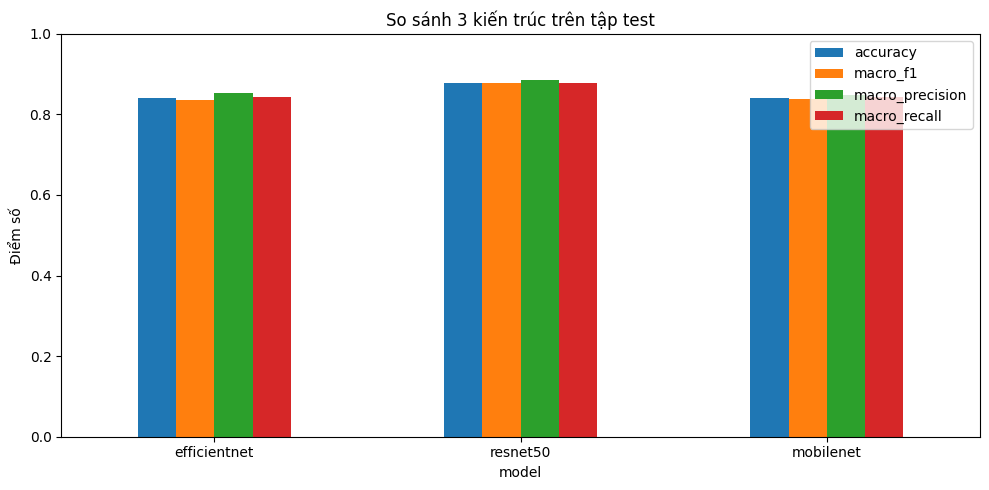

In [ ]:
import matplotlib.pyplot as plt

cols = [c for c in ["accuracy", "macro_f1", "macro_precision", "macro_recall"]
        if c in df_compare.columns]

ax = df_compare[cols].plot(kind="bar", figsize=(10, 5))
ax.set_ylim(0, 1)
ax.set_title("So sánh 3 kiến trúc trên tập test")
ax.set_ylabel("Điểm số")
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "model_comparison_bar.png"), dpi=150)
plt.show()


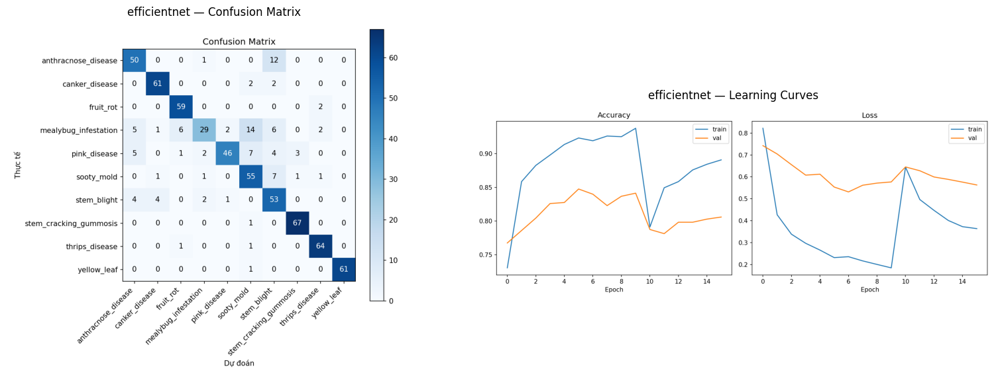

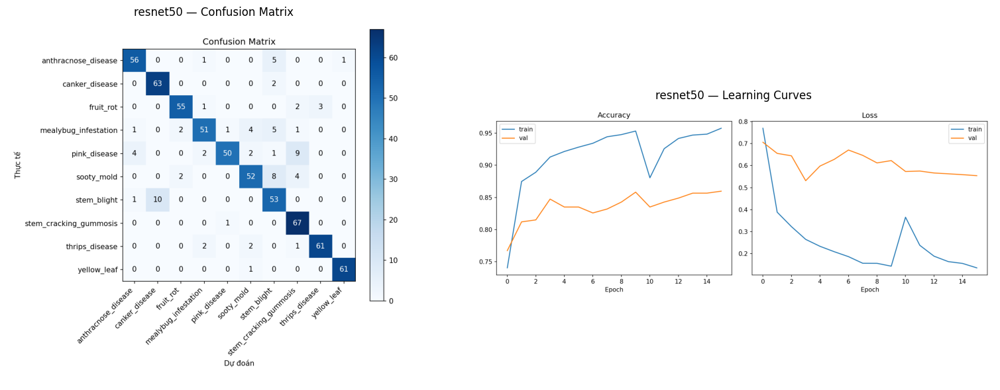

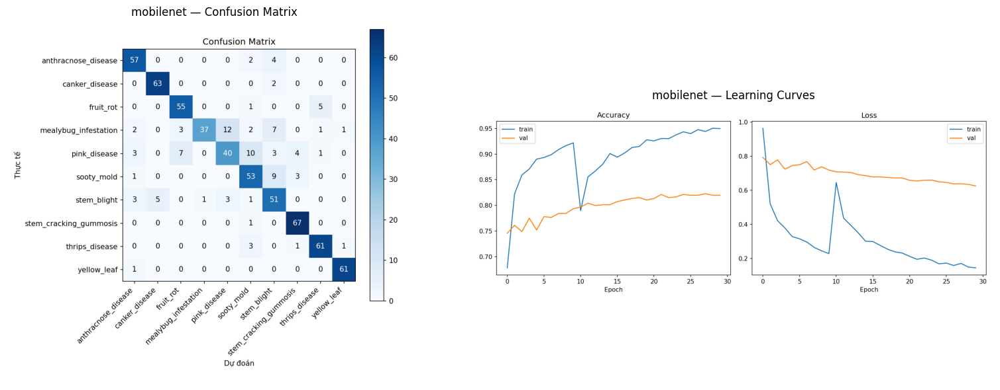

In [ ]:
# Hiển thị confusion matrix + learning curves của từng model
from PIL import Image

for m in ["efficientnet", "resnet50", "mobilenet"]:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    for ax, suffix, title in [
        (axes[0], "confusion_matrix", f"{m} — Confusion Matrix"),
        (axes[1], "learning_curves", f"{m} — Learning Curves"),
    ]:
        path = os.path.join(OUTPUT_DIR, f"{m}_{suffix}.png")
        if os.path.exists(path):
            ax.imshow(Image.open(path))
            ax.set_title(title)
        ax.axis("off")
    plt.tight_layout()
    plt.show()


In [ ]:
# Sanity check: KHÔNG xóa kết quả chính ở đây.
# Ablation phía sau cần dùng efficientnet_test_results.json.
required_main_results = [
    os.path.join(OUTPUT_DIR, "efficientnet_test_results.json"),
    os.path.join(OUTPUT_DIR, "resnet50_test_results.json"),
    os.path.join(OUTPUT_DIR, "mobilenet_test_results.json"),
]

missing = [p for p in required_main_results if not os.path.exists(p)]
if missing:
    raise FileNotFoundError(
        "Thiếu kết quả main experiment: " + ", ".join(missing) +
        ". Hãy chạy lại Mục 11 trước khi chạy ablation."
    )

print("✓ 3 file test_results của main experiments đang tồn tại và sẽ được giữ nguyên.")


✓ 3 file test_results của main experiments đang tồn tại và sẽ được giữ nguyên.


## 12. Thực nghiệm tiền xử lý ảnh truyền thống

Phần này đánh giá trực tiếp các kỹ thuật xử lý ảnh đã học trong CS406 trong bài toán phân loại bệnh sầu riêng.


1. **Original**: dùng kết quả ResNet50 chính đã huấn luyện ở phần trước.
2. **Gaussian Blur**: tạo bản train/validation/test đã Gaussian Blur và huấn luyện ResNet50.
3. **Bilateral Filter**: tạo bản train/validation/test đã Bilateral Filter và huấn luyện ResNet50.
4. **Sharpening**: tạo bản train/validation/test đã sharpening và huấn luyện ResNet50.
5. **Sobel và Canny**: dùng để phân tích/trực quan hóa biên, **không huấn luyện CNN riêng**.

Như vậy chỉ có **3 lượt train bổ sung**. Original ResNet50 được tái sử dụng từ thí nghiệm backbone comparison.

> Mỗi biến thể giữ nguyên split train/validation/test của dataset gốc. Không trộn ảnh giữa các split.


In [ ]:
import os, cv2, shutil, json, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

def gaussian_filter(img):
    return cv2.GaussianBlur(img, (5, 5), 0)

def bilateral_filter(img):
    return cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)

def sharpening_filter(img):
    kernel = np.array([
        [0, -1,  0],
        [-1, 5, -1],
        [0, -1,  0]
    ], dtype=np.float32)
    return cv2.filter2D(img, -1, kernel)

def sobel_filter(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    mag = cv2.magnitude(sx, sy)
    mag = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    return cv2.cvtColor(mag, cv2.COLOR_GRAY2RGB)

def canny_filter(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edge = cv2.Canny(gray, 100, 200)
    return cv2.cvtColor(edge, cv2.COLOR_GRAY2RGB)

TRAINABLE_PREPROCESS = {
    "gaussian": gaussian_filter,
    "bilateral": bilateral_filter,
    "sharpening": sharpening_filter,
}

ANALYSIS_ONLY = {
    "sobel": sobel_filter,
    "canny": canny_filter,
}

print("Train bổ sung:", list(TRAINABLE_PREPROCESS))
print("Chỉ phân tích:", list(ANALYSIS_ONLY))


Train bổ sung: ['gaussian', 'bilateral', 'sharpening']
Chỉ phân tích: ['sobel', 'canny']


### 12.1 Minh họa Original, Gaussian, Bilateral, Sharpening, Sobel và Canny


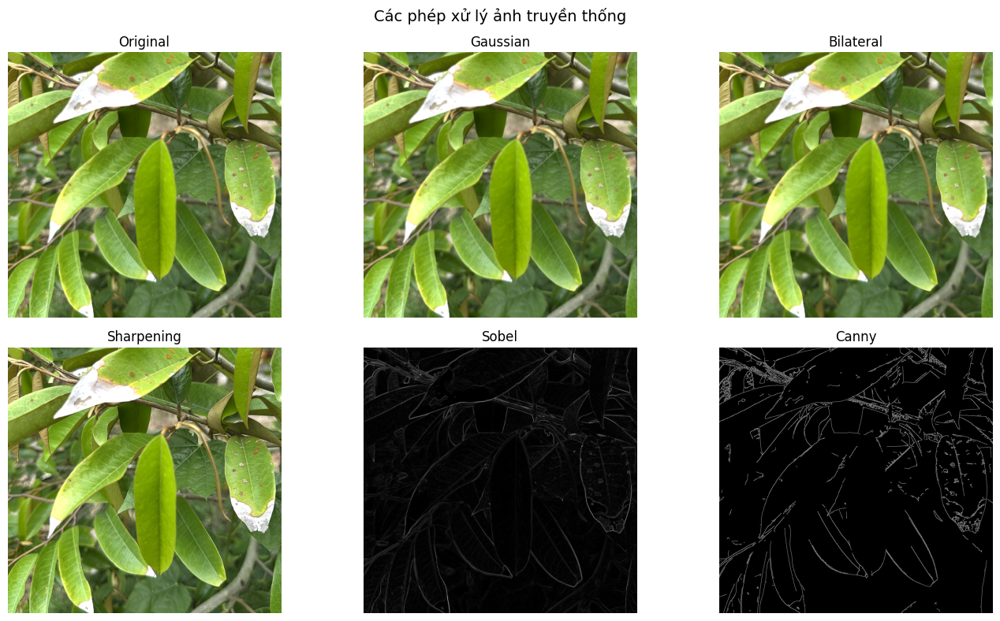

Ảnh mẫu: /content/drive/MyDrive/durian_leaf/data/Durian_Diseases/test/anthracnose_disease/00163.png


In [ ]:
# Tự tìm một ảnh test để minh họa
sample_path = None
for cls in CANONICAL_CLASS_NAMES:
    cls_dir = os.path.join(TEST_DIR, cls)
    if os.path.isdir(cls_dir):
        fs = sorted(
            os.path.join(cls_dir, f)
            for f in os.listdir(cls_dir)
            if os.path.isfile(os.path.join(cls_dir, f))
        )
        if fs:
            sample_path = fs[0]
            break

assert sample_path is not None, "Không tìm thấy ảnh test."

bgr = cv2.imread(sample_path)
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

visual_methods = {
    "Original": lambda x: x,
    "Gaussian": gaussian_filter,
    "Bilateral": bilateral_filter,
    "Sharpening": sharpening_filter,
    "Sobel": sobel_filter,
    "Canny": canny_filter,
}

fig, axes = plt.subplots(2, 3, figsize=(14, 8))
for ax, (name, fn) in zip(axes.flat, visual_methods.items()):
    ax.imshow(fn(rgb.copy()))
    ax.set_title(name)
    ax.axis("off")

plt.suptitle("Các phép xử lý ảnh truyền thống", fontsize=14)
plt.tight_layout()
plt.show()
print("Ảnh mẫu:", sample_path)


### 12.2 Tạo dataset tiền xử lý

Dataset mới được tạo từ **đúng các file của từng split gốc**.
Cell có cơ chế `DONE.json`: nếu biến thể đã tạo đầy đủ thì lần chạy sau sẽ bỏ qua.

Ảnh được lưu trong Drive để không phải xử lý lại mỗi lần restart Colab.


In [ ]:
PREPROCESS_ROOT = os.path.join(PROJECT_DIR, "preprocessed_datasets")
os.makedirs(PREPROCESS_ROOT, exist_ok=True)

SOURCE_SPLITS = {
    "train": TRAIN_DIR,
    "validation": VAL_DIR,
    "test": TEST_DIR,
}

VALID_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def count_images(root):
    total = 0
    for cls in CANONICAL_CLASS_NAMES:
        cls_dir = os.path.join(root, cls)
        if not os.path.isdir(cls_dir):
            continue
        total += sum(
            os.path.splitext(f)[1].lower() in VALID_EXTS
            for f in os.listdir(cls_dir)
            if os.path.isfile(os.path.join(cls_dir, f))
        )
    return total

def build_processed_split(src_root, dst_root, fn):
    os.makedirs(dst_root, exist_ok=True)

    for cls in CANONICAL_CLASS_NAMES:
        src_cls = os.path.join(src_root, cls)
        dst_cls = os.path.join(dst_root, cls)
        os.makedirs(dst_cls, exist_ok=True)

        files = sorted(
            f for f in os.listdir(src_cls)
            if os.path.isfile(os.path.join(src_cls, f))
            and os.path.splitext(f)[1].lower() in VALID_EXTS
        )

        for filename in files:
            src_path = os.path.join(src_cls, filename)
            dst_path = os.path.join(dst_cls, filename)

            # Resume-safe: ảnh đã tồn tại thì không xử lý lại.
            if os.path.exists(dst_path):
                continue

            bgr = cv2.imread(src_path)
            if bgr is None:
                raise ValueError(f"Không đọc được: {src_path}")

            rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
            out_rgb = fn(rgb)
            out_bgr = cv2.cvtColor(out_rgb, cv2.COLOR_RGB2BGR)

            ok = cv2.imwrite(dst_path, out_bgr)
            if not ok:
                raise IOError(f"Không ghi được: {dst_path}")

def build_preprocessed_dataset(method, fn):
    method_root = os.path.join(PREPROCESS_ROOT, method)
    done_path = os.path.join(method_root, "DONE.json")

    expected = {
        "train": count_images(TRAIN_DIR),
        "validation": count_images(VAL_DIR),
        "test": count_images(TEST_DIR),
    }

    if os.path.exists(done_path):
        with open(done_path, "r", encoding="utf-8") as f:
            saved = json.load(f)
        if saved.get("counts") == expected:
            print(f"✓ {method}: dataset đã có, bỏ qua")
            return method_root

    for split, src_root in SOURCE_SPLITS.items():
        dst_root = os.path.join(method_root, split)
        print(f"{method}: {split}")
        build_processed_split(src_root, dst_root, fn)

    actual = {
        split: count_images(os.path.join(method_root, split))
        for split in SOURCE_SPLITS
    }
    assert actual == expected, (method, expected, actual)

    os.makedirs(method_root, exist_ok=True)
    with open(done_path, "w", encoding="utf-8") as f:
        json.dump(
            {"method": method, "counts": actual},
            f, ensure_ascii=False, indent=2
        )

    print(f"✓ Hoàn tất {method}: {actual}")
    return method_root

processed_roots = {}
for method, fn in TRAINABLE_PREPROCESS.items():
    processed_roots[method] = build_preprocessed_dataset(method, fn)

processed_roots


✓ gaussian: dataset đã có, bỏ qua
✓ bilateral: dataset đã có, bỏ qua
✓ sharpening: dataset đã có, bỏ qua


{'gaussian': '/content/drive/MyDrive/durian_leaf/preprocessed_datasets/gaussian',
 'bilateral': '/content/drive/MyDrive/durian_leaf/preprocessed_datasets/bilateral',
 'sharpening': '/content/drive/MyDrive/durian_leaf/preprocessed_datasets/sharpening'}

### 12.3 Huấn luyện ResNet50 trên từng biến thể

Cell dưới đây **không chạy lại Original ResNet50**. Nó chỉ huấn luyện 3 biến thể mới và lưu checkpoint riêng:

- `resnet50_gaussian_best.keras`
- `resnet50_bilateral_best.keras`
- `resnet50_sharpening_best.keras`

Để tránh ghi đè cấu hình/dataset chính, mỗi lần train notebook tạo một `config.py` tạm thời trỏ tới dataset tiền xử lý rồi gọi lại `train.py` của project.

`FORCE_IMAGE_PROCESSING = False` giúp lần chạy sau tái sử dụng checkpoint đã có.


In [ ]:
# ============================================================
# 12.3 — TRAIN RESNET50 TRỰC TIẾP CHO TỪNG PREPROCESSING
# Không gọi train.py subprocess, không patch config.py.
# ============================================================

import os
import json
import tensorflow as tf
import pandas as pd

from models import build_model

FORCE_IMAGE_PROCESSING = False

IMAGE_PROCESSING_MODEL_DIR = os.path.join(
    PROJECT_DIR, "saved_models", "image_processing"
)
IMAGE_PROCESSING_OUTPUT_DIR = os.path.join(
    PROJECT_DIR, "outputs", "image_processing"
)

os.makedirs(IMAGE_PROCESSING_MODEL_DIR, exist_ok=True)
os.makedirs(IMAGE_PROCESSING_OUTPUT_DIR, exist_ok=True)

# Giữ cùng training recipe với main experiment.
IP_EPOCHS_HEAD = int(EPOCHS_HEAD)
IP_EPOCHS_FINE_TUNE = int(EPOCHS_FINE_TUNE)
IP_LR_HEAD = float(LEARNING_RATE_HEAD)

# Nếu config.py có LR fine-tune thì dùng; nếu không thì dùng 1e-5.
IP_LR_FINE = float(
    getattr(config, "LEARNING_RATE_FINE", getattr(config, "LEARNING_RATE_FINE_TUNE", 1e-5))
)

IP_FINE_TUNE_LAYERS = int(getattr(config, "UNFREEZE_LAST_N_LAYERS", 30))


def make_processed_dataset(directory, shuffle):
    """Load processed dataset với đúng 10 class và cùng input 224x224."""
    if not os.path.isdir(directory):
        raise FileNotFoundError(directory)

    ds = tf.keras.utils.image_dataset_from_directory(
        directory,
        labels="inferred",
        label_mode="categorical",
        class_names=CANONICAL_CLASS_NAMES,
        image_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        shuffle=shuffle,
        seed=SEED,
    )

    # Augmentation chỉ áp dụng train, giống main experiment.
    if shuffle:
        ds = ds.map(
            lambda x, y: (
                AUGMENTATION_LAYERS(x, training=True),
                y
            ),
            num_parallel_calls=tf.data.AUTOTUNE,
        )

    return ds.prefetch(tf.data.AUTOTUNE)


def set_backbone_trainable(model, trainable, last_n=None):
    """
    Tìm backbone bên trong model và điều khiển freeze/fine-tune.
    Ưu tiên layer là tf.keras.Model có nhiều layer con.
    """
    candidates = [
        layer for layer in model.layers
        if isinstance(layer, tf.keras.Model)
        and len(getattr(layer, "layers", [])) > 20
    ]

    if not candidates:
        raise RuntimeError(
            "Không tìm thấy backbone model để freeze/fine-tune."
        )

    backbone = max(candidates, key=lambda x: len(x.layers))

    if not trainable:
        backbone.trainable = False
        return backbone

    backbone.trainable = True

    if last_n is not None and last_n > 0:
        for layer in backbone.layers[:-last_n]:
            layer.trainable = False
        for layer in backbone.layers[-last_n:]:
            # Giữ BatchNorm frozen để fine-tune ổn định hơn.
            if isinstance(layer, tf.keras.layers.BatchNormalization):
                layer.trainable = False
            else:
                layer.trainable = True

    return backbone


def train_processed_resnet50(method, method_root):
    """
    Train ResNet50 trực tiếp trong notebook:
      Phase 1: frozen backbone
      Phase 2: fine-tune phần cuối backbone
    Checkpoint riêng cho từng preprocessing.
    """

    target_ckpt = os.path.join(
        IMAGE_PROCESSING_MODEL_DIR,
        f"resnet50_{method}_best.keras"
    )

    history_path = os.path.join(
        IMAGE_PROCESSING_OUTPUT_DIR,
        f"resnet50_{method}_history.json"
    )
    head_ckpt = os.path.join(
        IMAGE_PROCESSING_MODEL_DIR,
        f"resnet50_{method}_head_best.keras"
    )
    fine_ckpt = os.path.join(
        IMAGE_PROCESSING_MODEL_DIR,
        f"resnet50_{method}_fine_best.keras"
    )

    if (
        os.path.isfile(target_ckpt)
        and not FORCE_IMAGE_PROCESSING
    ):
        print(f"✓ {method}: checkpoint đã có -> SKIP")
        return target_ckpt

    train_root = os.path.join(method_root, "train")
    val_root = os.path.join(method_root, "validation")

    print("\n" + "=" * 72)
    print(f"TRAIN RESNET50 — {method.upper()}")
    print("Train:", train_root)
    print("Val  :", val_root)
    print("Save :", target_ckpt)
    print("=" * 72)

    tf.keras.backend.clear_session()
    tf.keras.utils.set_random_seed(SEED)

    train_ds = make_processed_dataset(
        train_root,
        shuffle=True
    )

    val_ds = make_processed_dataset(
        val_root,
        shuffle=False
    )

    # Cùng class-weighting recipe với main experiment.
    counts = []
    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
    for cls in CANONICAL_CLASS_NAMES:
        cls_dir = os.path.join(train_root, cls)
        counts.append(sum(
            1 for fn in os.listdir(cls_dir)
            if os.path.isfile(os.path.join(cls_dir, fn))
            and os.path.splitext(fn)[1].lower() in valid_ext
        ))
    total_count = sum(counts)
    class_weights = {
        i: total_count / (len(counts) * n)
        for i, n in enumerate(counts)
    }

    # --------------------------------------------------------
    # BUILD MODEL
    # --------------------------------------------------------
    model, _ = build_model(
        "resnet50",
        freeze_backbone=True
    )

    backbone = set_backbone_trainable(
        model,
        trainable=False
    )

    print(
        f"Backbone: {backbone.name} | "
        f"{len(backbone.layers)} layers"
    )

    # --------------------------------------------------------
    # PHASE 1 — TRAIN CLASSIFIER HEAD
    # --------------------------------------------------------
    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate=IP_LR_HEAD
        ),
        loss="categorical_crossentropy",
        metrics=["accuracy"],
    )

    callbacks_head = [
        tf.keras.callbacks.ModelCheckpoint(
            head_ckpt,
            monitor="val_accuracy",
            mode="max",
            save_best_only=True,
            verbose=1,
        ),
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=4,
            restore_best_weights=True,
            verbose=1,
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.5,
            patience=2,
            min_lr=1e-7,
            verbose=1,
        ),
    ]

    print("\n--- Phase 1: Frozen backbone ---")

    hist_head = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=IP_EPOCHS_HEAD,
        class_weight=class_weights,
        callbacks=callbacks_head,
        verbose=1,
    )

    # --------------------------------------------------------
    # PHASE 2 — FINE-TUNE
    # --------------------------------------------------------
    backbone = set_backbone_trainable(
        model,
        trainable=True,
        last_n=IP_FINE_TUNE_LAYERS,
    )

    trainable_backbone = sum(
        int(layer.trainable)
        for layer in backbone.layers
    )

    print(
        f"\n--- Phase 2: Fine-tune "
        f"{trainable_backbone} backbone layers ---"
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate=IP_LR_FINE
        ),
        loss="categorical_crossentropy",
        metrics=["accuracy"],
    )

    callbacks_ft = [
        tf.keras.callbacks.ModelCheckpoint(
            fine_ckpt,
            monitor="val_accuracy",
            mode="max",
            save_best_only=True,
            verbose=1,
        ),
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=4,
            restore_best_weights=True,
            verbose=1,
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.5,
            patience=2,
            min_lr=1e-7,
            verbose=1,
        ),
    ]

    hist_ft = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=IP_EPOCHS_FINE_TUNE,
        class_weight=class_weights,
        callbacks=callbacks_ft,
        verbose=1,
    )

    # --------------------------------------------------------
    # CHỌN CHECKPOINT TỐT NHẤT TRÊN VALIDATION GIỮA 2 PHASE
    # --------------------------------------------------------
    head_best = max(hist_head.history.get("val_accuracy", [-1.0]))
    fine_best = max(hist_ft.history.get("val_accuracy", [-1.0]))

    chosen = fine_ckpt if fine_best >= head_best else head_ckpt
    if not os.path.isfile(chosen):
        raise FileNotFoundError(
            f"Không tìm thấy checkpoint phase được chọn: {chosen}"
        )

    shutil.copy2(chosen, target_ckpt)

    if not os.path.isfile(target_ckpt):
        raise FileNotFoundError(
            f"Không tạo được checkpoint cuối: {target_ckpt}"
        )

    print(
        f"✓ Best validation accuracy: "
        f"head={head_best:.4f}, fine={fine_best:.4f}"
    )

    # --------------------------------------------------------
    # SAVE HISTORY
    # --------------------------------------------------------
    history = {
        "method": method,
        "checkpoint": target_ckpt,
        "phase_1": {
            k: [float(x) for x in v]
            for k, v in hist_head.history.items()
        },
        "phase_2": {
            k: [float(x) for x in v]
            for k, v in hist_ft.history.items()
        },
        "config": {
            "img_size": list(IMG_SIZE),
            "batch_size": int(BATCH_SIZE),
            "seed": int(SEED),
            "epochs_head": IP_EPOCHS_HEAD,
            "epochs_fine_tune": IP_EPOCHS_FINE_TUNE,
            "lr_head": IP_LR_HEAD,
            "lr_fine": IP_LR_FINE,
            "fine_tune_layers": IP_FINE_TUNE_LAYERS,
        },
    }

    with open(
        history_path,
        "w",
        encoding="utf-8"
    ) as f:
        json.dump(
            history,
            f,
            ensure_ascii=False,
            indent=2
        )

    print("\n✓ Saved checkpoint:", target_ckpt)
    print("✓ Saved history   :", history_path)

    return target_ckpt


# ============================================================
# TRAIN 3 PREPROCESSING VARIANTS
# ============================================================

processed_checkpoints = {}

for method in [
    "gaussian",
    "bilateral",
    "sharpening",
]:
    if method not in processed_roots:
        raise KeyError(
            f"processed_roots không có '{method}'. "
            "Hãy chạy cell tạo preprocessed dataset trước."
        )

    processed_checkpoints[method] = (
        train_processed_resnet50(
            method,
            processed_roots[method]
        )
    )


print("\n" + "=" * 72)
print("PREPROCESSING CHECKPOINTS")
print("=" * 72)

for method, ckpt in processed_checkpoints.items():
    print(
        f"{method:12s}: "
        f"{'✓' if os.path.isfile(ckpt) else '✗'} "
        f"{ckpt}"
    )

processed_checkpoints


✓ gaussian: checkpoint đã có -> SKIP
✓ bilateral: checkpoint đã có -> SKIP
✓ sharpening: checkpoint đã có -> SKIP

PREPROCESSING CHECKPOINTS
gaussian    : ✓ /content/drive/MyDrive/durian_leaf/saved_models/image_processing/resnet50_gaussian_best.keras
bilateral   : ✓ /content/drive/MyDrive/durian_leaf/saved_models/image_processing/resnet50_bilateral_best.keras
sharpening  : ✓ /content/drive/MyDrive/durian_leaf/saved_models/image_processing/resnet50_sharpening_best.keras


{'gaussian': '/content/drive/MyDrive/durian_leaf/saved_models/image_processing/resnet50_gaussian_best.keras',
 'bilateral': '/content/drive/MyDrive/durian_leaf/saved_models/image_processing/resnet50_bilateral_best.keras',
 'sharpening': '/content/drive/MyDrive/durian_leaf/saved_models/image_processing/resnet50_sharpening_best.keras'}

### 12.4 Đánh giá Original vs Gaussian vs Bilateral vs Sharpening

Đánh giá sử dụng **test split tương ứng** của từng pipeline.

  Các chỉ số được tính thống nhất: Accuracy, Macro Precision, Macro Recall và Macro F1.

Original lấy từ checkpoint ResNet50 chính; ba biến thể còn lại lấy từ checkpoint vừa huấn luyện.


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def load_test_arrays(test_root):
    paths, labels = [], []
    for label, cls in enumerate(CANONICAL_CLASS_NAMES):
        cls_dir = os.path.join(test_root, cls)
        for fn in sorted(os.listdir(cls_dir)):
            p = os.path.join(cls_dir, fn)
            if os.path.isfile(p) and os.path.splitext(fn)[1].lower() in VALID_EXTS:
                paths.append(p)
                labels.append(label)
    return paths, np.array(labels, dtype=np.int32)

def evaluate_checkpoint(checkpoint, test_root, batch_size=32):
    model = tf.keras.models.load_model(checkpoint, compile=False)
    paths, y_true = load_test_arrays(test_root)

    preds = []
    size = tuple(IMG_SIZE)

    for start in range(0, len(paths), batch_size):
        batch_paths = paths[start:start + batch_size]
        images = []

        for p in batch_paths:
            bgr = cv2.imread(p)
            if bgr is None:
                raise ValueError(p)
            rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
            rgb = cv2.resize(rgb, size)
            images.append(rgb.astype(np.float32))

        probs = model.predict(np.stack(images), verbose=0)
        # Hỗ trợ cả model trả logits lẫn probabilities.
        row_sums = np.sum(probs, axis=1)
        if (
            np.any(probs < 0)
            or np.any(probs > 1)
            or not np.allclose(row_sums, 1.0, atol=1e-3)
        ):
            probs = tf.nn.softmax(probs, axis=1).numpy()

        preds.extend(np.argmax(probs, axis=1).tolist())

    y_pred = np.array(preds)

    return {
        "Accuracy": accuracy_score(y_true, y_pred),
        "Macro Precision": precision_score(
            y_true, y_pred, average="macro", zero_division=0
        ),
        "Macro Recall": recall_score(
            y_true, y_pred, average="macro", zero_division=0
        ),
        "Macro F1": f1_score(
            y_true, y_pred, average="macro", zero_division=0
        ),
        "N Test": len(y_true),
    }

main_resnet_ckpt = os.path.join(PROJECT_DIR, "saved_models", "resnet50_best.keras")
assert os.path.exists(main_resnet_ckpt), main_resnet_ckpt

experiment_specs = {
    "Original": (main_resnet_ckpt, TEST_DIR),
    "Gaussian": (
        processed_checkpoints["gaussian"],
        os.path.join(processed_roots["gaussian"], "test")
    ),
    "Bilateral": (
        processed_checkpoints["bilateral"],
        os.path.join(processed_roots["bilateral"], "test")
    ),
    "Sharpening": (
        processed_checkpoints["sharpening"],
        os.path.join(processed_roots["sharpening"], "test")
    ),
}

PREPROCESS_RESULTS_CSV = os.path.join(
    PROJECT_DIR, "preprocessing_training_results.csv"
)

if os.path.exists(PREPROCESS_RESULTS_CSV) and not FORCE_IMAGE_PROCESSING:
    preprocessing_df = pd.read_csv(PREPROCESS_RESULTS_CSV)
    print("✓ Dùng kết quả đã lưu:", PREPROCESS_RESULTS_CSV)
else:
    rows = []
    for method, (ckpt, test_root) in experiment_specs.items():
        print("Đánh giá:", method)
        metrics = evaluate_checkpoint(ckpt, test_root)
        rows.append({"Method": method, **metrics})

    preprocessing_df = pd.DataFrame(rows)
    preprocessing_df.to_csv(PREPROCESS_RESULTS_CSV, index=False)
    print("✓ Saved:", PREPROCESS_RESULTS_CSV)

base_acc = preprocessing_df.loc[
    preprocessing_df["Method"] == "Original", "Accuracy"
].iloc[0]
base_f1 = preprocessing_df.loc[
    preprocessing_df["Method"] == "Original", "Macro F1"
].iloc[0]

preprocessing_df["Delta Accuracy"] = preprocessing_df["Accuracy"] - base_acc
preprocessing_df["Delta Macro F1"] = preprocessing_df["Macro F1"] - base_f1

display(preprocessing_df.round(4))


✓ Dùng kết quả đã lưu: /content/drive/MyDrive/durian_leaf/preprocessing_training_results.csv


,Method,Accuracy,Macro Precision,Macro Recall,Macro F1,N Test,Delta Accuracy,Delta Macro F1
0,Original,0.8765,0.8848,0.8774,0.8772,648,0.0000,0.0000
1,Gaussian,0.8981,0.9007,0.8989,0.8987,648,0.0216,0.0215
2,Bilateral,0.8904,0.8918,0.8911,0.8905,648,0.0139,0.0133
3,Sharpening,0.8781,0.8826,0.8796,0.8766,648,0.0015,-0.0006


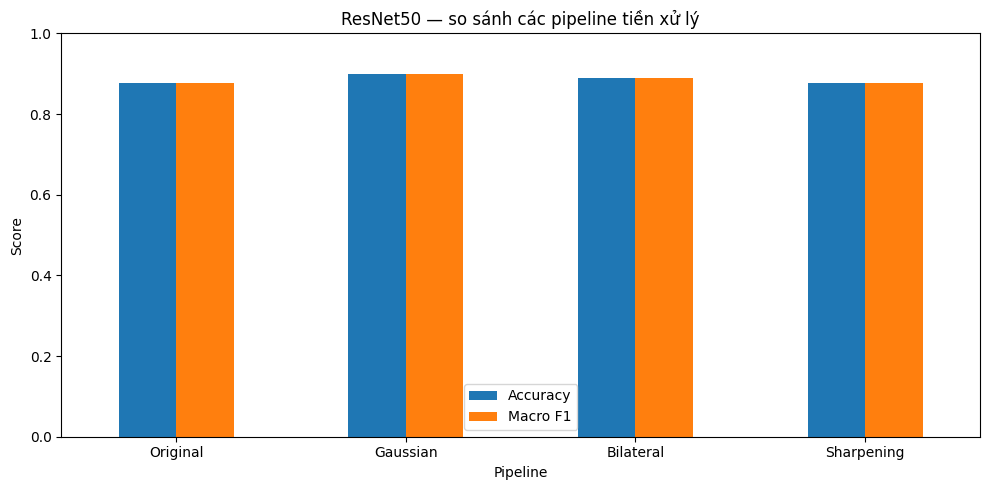

,Method,Accuracy,Macro F1,Delta Accuracy,Delta Macro F1
0,Original,0.8765,0.8772,0.0000,0.0000
1,Gaussian,0.8981,0.8987,0.0216,0.0215
2,Bilateral,0.8904,0.8905,0.0139,0.0133
3,Sharpening,0.8781,0.8766,0.0015,-0.0006


In [ ]:
plot_df = preprocessing_df.set_index("Method")[["Accuracy", "Macro F1"]]

ax = plot_df.plot(
    kind="bar",
    figsize=(10, 5),
    ylim=(0, 1),
    rot=0
)
ax.set_title("ResNet50 — so sánh các pipeline tiền xử lý")
ax.set_xlabel("Pipeline")
ax.set_ylabel("Score")
plt.tight_layout()
plt.show()

display(
    preprocessing_df[
        ["Method", "Accuracy", "Macro F1",
         "Delta Accuracy", "Delta Macro F1"]
    ].round(4)
)


### 12.5 Sobel và Canny — phân tích biên

Sobel và Canny là các kỹ thuật xử lý ảnh quan trọng trong CS406, nhưng không dùng làm pipeline train chính.

 Hai phương pháp này loại bỏ nhiều thông tin màu/texture của ảnh, nên trong đồ án chúng được dùng để **quan sát cấu trúc biên của vùng tổn thương**


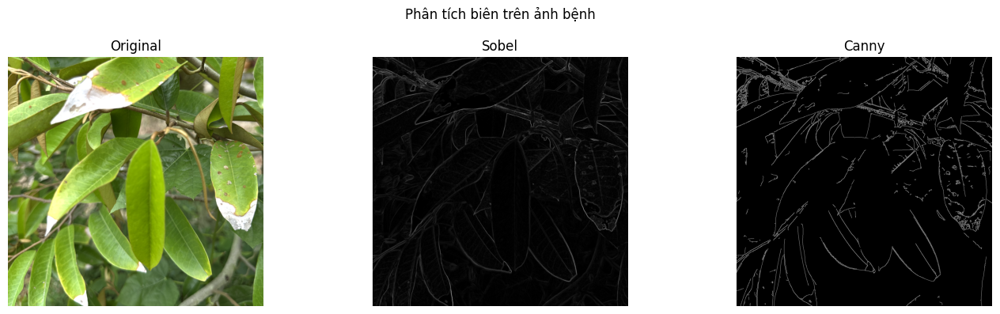

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

axes[0].imshow(rgb)
axes[0].set_title("Original")

axes[1].imshow(sobel_filter(rgb))
axes[1].set_title("Sobel")

axes[2].imshow(canny_filter(rgb))
axes[2].set_title("Canny")

for ax in axes:
    ax.axis("off")

plt.suptitle("Phân tích biên trên ảnh bệnh")
plt.tight_layout()
plt.show()


### 12.6 Kết luận thí nghiệm

- So sánh **Original vs Gaussian vs Bilateral vs Sharpening** dưới cùng backbone ResNet50.
- Giữ nguyên train/validation/test split để so sánh công bằng.
- Báo cáo Accuracy và Macro F1 là hai chỉ số chính.
- Sobel/Canny được trình bày như kỹ thuật phân tích biên, không phải classifier riêng.


## 13. Ablation 1 — Có augmentation vs không augmentation

`train.py` mặc định luôn bật augmentation.
 cell dưới huấn luyện lại **EfficientNetB0** (model nhẹ nhất)

  trong 2 kịch  bản ngắn hơn (chỉ giai đoạn train head,

   không fine-tune) để so sánh nhanh tác động của augmentation,

   


In [ ]:
import tensorflow as tf, os
import numpy as np, pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from models import build_model

ABLATION_EPOCHS = 10
R1 = os.path.join(ABLATION_OUTPUT_DIR, "augmentation_results.json")
M1 = os.path.join(ABLATION_OUTPUT_DIR, "augmentation_metadata.json")
cfg1 = {"model":"efficientnet","epochs":10,"backbone":"frozen",
        "seed":int(SEED),"img_size":list(IMG_SIZE),
        "comparison":"augmentation_vs_no_augmentation"}
fp1 = config_fingerprint(cfg1)

def evaluate_multiclass_model(model, test_ds):
    yt, yp = [], []
    for images, labels in test_ds:
        probs = model.predict(images, verbose=0)
        yt.extend(np.argmax(labels.numpy(),1)); yp.extend(np.argmax(probs,1))
    return {
        "accuracy":float(accuracy_score(yt,yp)),
        "macro_precision":float(precision_score(yt,yp,average="macro",zero_division=0)),
        "macro_recall":float(recall_score(yt,yp,average="macro",zero_division=0)),
        "macro_f1":float(f1_score(yt,yp,average="macro",zero_division=0))
    }

def run_aug_branch(augment, tag):
    tf.keras.backend.clear_session()
    tf.keras.utils.set_random_seed(SEED)
    tr=make_dataset(TRAIN_DIR,shuffle=True,augment=augment)
    va=make_dataset(VAL_DIR,shuffle=False,augment=False)
    te=make_dataset(TEST_DIR,shuffle=False,augment=False)
    model,_=build_model("efficientnet",freeze_backbone=True)
    model.compile(optimizer=tf.keras.optimizers.Adam(LEARNING_RATE_HEAD),
                  loss="categorical_crossentropy",metrics=["accuracy"])
    ckpt=os.path.join(ABLATION_MODEL_DIR,f"augmentation_{tag}_best.keras")
    hist=model.fit(tr,validation_data=va,epochs=ABLATION_EPOCHS,verbose=1,
        callbacks=[
            tf.keras.callbacks.ModelCheckpoint(ckpt,monitor="val_loss",
                                                save_best_only=True,verbose=1),
            tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=4,
                                             restore_best_weights=True)])
    best=tf.keras.models.load_model(ckpt)
    res=evaluate_multiclass_model(best,te)
    res["epochs_ran"]=len(hist.history["loss"]); res["checkpoint"]=os.path.basename(ckpt)
    save_json(os.path.join(ABLATION_OUTPUT_DIR,f"augmentation_{tag}_history.json"),
              {k:[float(x) for x in v] for k,v in hist.history.items()})
    return res

if os.path.exists(R1) and artifact_valid(M1,"ablation_1:augmentation",fp1) and not FORCE["ablation_1"]:
    x=load_json(R1); results_with_aug=x["with_augmentation"]; results_no_aug=x["without_augmentation"]
    print("✓ Ablation 1 cache hợp lệ -> SKIP 2 lần train")
else:
    results_with_aug=run_aug_branch(True,"with")
    results_no_aug=run_aug_branch(False,"without")
    save_json(R1,{"with_augmentation":results_with_aug,
                  "without_augmentation":results_no_aug})
    save_json(M1,{"experiment":"ablation_1:augmentation","dataset_total":5451,
                  "dataset_fingerprint":DATASET_FINGERPRINT,
                  "config":cfg1,"config_fingerprint":fp1})
    print("✓ Ablation 1 đã lưu 2 checkpoint + histories + results")

df_aug=pd.DataFrame([results_with_aug,results_no_aug],
                    index=["Có augmentation","Không augmentation"])
display(df_aug)


Found 4154 files belonging to 10 classes.
Found 649 files belonging to 10 classes.
Found 648 files belonging to 10 classes.
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6128 - loss: 1.1947   
Epoch 1: val_loss improved from None to 0.72559, saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_with_best.keras

Epoch 1: finished saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_with_best.keras
130/130 ━━━━━━━━━━━━━━━━━━━━ 211s 1s/step - accuracy: 0.7313 - loss: 0.8163 - val_accuracy: 0.7488 - val_loss: 0.7256
Epoch 2/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8580 - loss: 0.4270
Epoch 2: val_loss improved from 0.72559 to 0.64481, saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_with_best.keras

Epoch 2: finished saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/augmentation_wit

,accuracy,macro_precision,macro_recall,macro_f1,epochs_ran,checkpoint
Có augmentation,0.853395,0.859254,0.854638,0.851450,10,augmentation_with_best.keras
Không augmentation,0.841049,0.845032,0.841695,0.833891,7,augmentation_without_best.keras


## 14. Ablation 2 — Freeze toàn bộ backbone vs Fine-tune một phần

So sánh **EfficientNetB0** chỉ train head (backbone freeze hoàn toàn, không có giai đoạn fine-tune) với model đã fine-tune đầy đủ

In [ ]:
import tensorflow as tf, os, pandas as pd

R2=os.path.join(ABLATION_OUTPUT_DIR,"freeze_finetune_results.json")
M2=os.path.join(ABLATION_OUTPUT_DIR,"freeze_finetune_metadata.json")
C2=os.path.join(ABLATION_MODEL_DIR,"frozen_only_best.keras")
budget=int(EPOCHS_HEAD+EPOCHS_FINE_TUNE)
cfg2={"model":"efficientnet","comparison":"frozen_vs_main_finetuned",
      "frozen_epoch_budget":budget,"augmentation":True,
      "seed":int(SEED),"img_size":list(IMG_SIZE)}
fp2=config_fingerprint(cfg2)

if (os.path.exists(R2) and os.path.exists(C2)
    and artifact_valid(M2,"ablation_2:freeze_vs_finetune",fp2)
    and not FORCE["ablation_2"]):
    x=load_json(R2); results_frozen_only=x["frozen_only"]; results_finetuned=x["fine_tuned"]
    print("✓ Ablation 2 cache hợp lệ -> SKIP frozen training")
else:
    tf.keras.backend.clear_session(); tf.keras.utils.set_random_seed(SEED)
    tr=make_dataset(TRAIN_DIR,shuffle=True,augment=True)
    va=make_dataset(VAL_DIR,shuffle=False,augment=False)
    te=make_dataset(TEST_DIR,shuffle=False,augment=False)
    model,_=build_model("efficientnet",freeze_backbone=True)
    model.compile(optimizer=tf.keras.optimizers.Adam(LEARNING_RATE_HEAD),
                  loss="categorical_crossentropy",metrics=["accuracy"])
    hist=model.fit(tr,validation_data=va,epochs=budget,verbose=1,
        callbacks=[
            tf.keras.callbacks.ModelCheckpoint(C2,monitor="val_loss",
                                                save_best_only=True,verbose=1),
            tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=6,
                                             restore_best_weights=True)])
    best=tf.keras.models.load_model(C2)
    results_frozen_only=evaluate_multiclass_model(best,te)
    results_frozen_only["epochs_ran"]=len(hist.history["loss"])
    results_frozen_only["checkpoint"]=os.path.basename(C2)
    save_json(os.path.join(ABLATION_OUTPUT_DIR,"frozen_only_history.json"),
              {k:[float(x) for x in v] for k,v in hist.history.items()})

    main=load_json(os.path.join(OUTPUT_DIR, "efficientnet_test_results.json"))
    keys=["accuracy","macro_precision","macro_recall","macro_f1"]
    results_finetuned={k:float(main[k]) for k in keys}
    results_finetuned["checkpoint"]=main.get("checkpoint","efficientnet_best.keras")
    save_json(R2,{"frozen_only":results_frozen_only,"fine_tuned":results_finetuned})
    save_json(M2,{"experiment":"ablation_2:freeze_vs_finetune","dataset_total":5451,
                  "dataset_fingerprint":DATASET_FINGERPRINT,
                  "config":cfg2,"config_fingerprint":fp2})
    print("✓ Ablation 2 đã lưu checkpoint + history + results")

df_freeze=pd.DataFrame([results_frozen_only,results_finetuned],
    index=["Freeze toàn bộ backbone","Fine-tune một phần (main experiment)"])
display(df_freeze)


Found 4154 files belonging to 10 classes.
Found 649 files belonging to 10 classes.
Found 648 files belonging to 10 classes.
Epoch 1/30
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6137 - loss: 1.1917   
Epoch 1: val_loss improved from None to 0.73724, saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/frozen_only_best.keras

Epoch 1: finished saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/frozen_only_best.keras
130/130 ━━━━━━━━━━━━━━━━━━━━ 183s 1s/step - accuracy: 0.7400 - loss: 0.8069 - val_accuracy: 0.7504 - val_loss: 0.7372
Epoch 2/30
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 972ms/step - accuracy: 0.8602 - loss: 0.4147
Epoch 2: val_loss improved from 0.73724 to 0.60395, saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/frozen_only_best.keras

Epoch 2: finished saving model to /content/drive/MyDrive/durian_leaf/saved_models/ablation/frozen_only_best.keras
130/130 ━━━━━━━━━━━━━━━━━━━━ 148s 1s/step - accuracy: 0.856

,accuracy,macro_precision,macro_recall,macro_f1,epochs_ran,checkpoint
Freeze toàn bộ backbone,0.845679,0.857451,0.846381,0.843048,10.0,frozen_only_best.keras
Fine-tune một phần (main experiment),0.841049,0.852080,0.842227,0.836841,NaN,efficientnet_best.keras


## 15. Phân tích lớp dễ nhầm lẫn

Liệt kê các cặp lớp bị nhầm lẫn nhiều nhất trên tập test, dựa trên **model tốt nhất theo Accuracy

Kết quả này dùng đúng checkpoint `best.keras` (fallback `final.keras`) đã được đối chiếu với bảng metric chính.


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix

best_model_name = df_compare["accuracy"].idxmax()
print("Model tốt nhất theo accuracy trên tập test:", best_model_name)

# Ưu tiên _best.keras — khớp đúng quy ước evaluate.py đang dùng ở Mục 12
# (log thực tế: "Đang tải model: saved_models/<model>_best.keras"), chỉ fallback
model_path = os.path.join(MODEL_DIR, f"{best_model_name}_best.keras")
if not os.path.exists(model_path):
    model_path = os.path.join(MODEL_DIR, f"{best_model_name}_final.keras")
model = tf.keras.models.load_model(model_path)
test_ds = make_dataset(TEST_DIR, shuffle=False, augment=False)

y_true, y_pred = [], []
for images, labels in test_ds:
    preds = model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))
y_true, y_pred = np.array(y_true), np.array(y_pred)

# labels=[0..9] tường minh: nếu không, sklearn tự suy luận số lớp từ chính
# y_true/y_pred — lỡ 1 lớp ít ảnh nhất (vd canker_disease) không xuất hiện trong
# tập test, ma trận trả về sẽ NHỎ HƠN 10x10, khiến vòng lặp bên dưới (giả định
# đúng 10x10) bị IndexError ngay lập tức.
all_labels = list(range(len(CANONICAL_CLASS_NAMES)))
cm = confusion_matrix(y_true, y_pred, labels=all_labels)
pairs = []
for i in range(len(CANONICAL_CLASS_NAMES)):
    for j in range(len(CANONICAL_CLASS_NAMES)):
        if i != j and cm[i, j] > 0:
            pairs.append((CANONICAL_CLASS_NAMES[i], CANONICAL_CLASS_NAMES[j], int(cm[i, j])))

df_confused = pd.DataFrame(pairs, columns=["Thực tế", "Dự đoán nhầm thành", "Số lượng"])
df_confused = df_confused.sort_values("Số lượng", ascending=False).reset_index(drop=True)
df_confused.head(10)


Model tốt nhất theo accuracy trên tập test: resnet50
Found 648 files belonging to 10 classes.


,Thực tế,Dự đoán nhầm thành,Số lượng
0,stem_blight,canker_disease,10
1,pink_disease,stem_cracking_gummosis,9
2,sooty_mold,stem_blight,8
3,anthracnose_disease,stem_blight,5
4,mealybug_infestation,stem_blight,5
5,pink_disease,anthracnose_disease,4
6,mealybug_infestation,sooty_mold,4
7,sooty_mold,stem_cracking_gummosis,4
8,fruit_rot,thrips_disease,3
9,mealybug_infestation,fruit_rot,2


## 16. Grad-CAM

Chạy Grad-CAM trên 1 ảnh mẫu mỗi lớp bằng model tốt nhất, để kiểm chứng model học đúng vùng tổn thương trên lá (không học nền/artefact).


In [ ]:
import glob, os, subprocess, sys

sample_images = []
for cls in CANONICAL_CLASS_NAMES:
    fs = sorted(
        p for p in glob.glob(os.path.join(TEST_DIR, cls, "*"))
        if os.path.isfile(p)
    )
    if fs:
        sample_images.append((cls, fs[0]))

gradcam_checkpoint = os.path.join(
    MODEL_DIR, f"{best_model_name}_best.keras"
)
if not os.path.isfile(gradcam_checkpoint):
    gradcam_checkpoint = os.path.join(
        MODEL_DIR, f"{best_model_name}_final.keras"
    )

for cls, img_path in sample_images:
    out_path = os.path.join(
        OUTPUT_DIR,
        f"gradcam_{best_model_name}_{os.path.basename(img_path)}"
    )

    if os.path.isfile(out_path) and not FORCE["gradcam"]:
        print(f"✓ {cls}: Grad-CAM đã có -> SKIP")
        continue

    print(f"--- {cls} ---")
    subprocess.run(
        [
            sys.executable,
            os.path.join(CODE_DIR, "gradcam.py"),
            "--model", best_model_name,
            "--checkpoint", gradcam_checkpoint,
            "--image", img_path,
        ],
        cwd=CODE_DIR,
        check=True,
        env=os.environ.copy(),
    )


--- anthracnose_disease ---
--- canker_disease ---
--- fruit_rot ---
--- mealybug_infestation ---
--- pink_disease ---
--- sooty_mold ---
--- stem_blight ---
--- stem_cracking_gummosis ---
--- thrips_disease ---
--- yellow_leaf ---


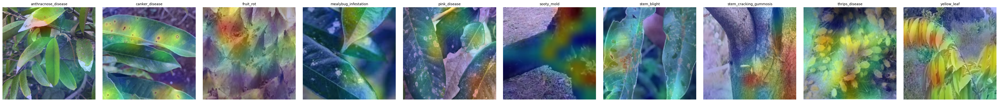

In [ ]:
# Hiển thị lưới ảnh Grad-CAM cho tất cả các lớp mẫu
n = len(sample_images)
fig, axes = plt.subplots(1, n, figsize=(4 * n, 4))
if n == 1:
    axes = [axes]
for ax, (cls, img_path) in zip(axes, sample_images):
    out_path = os.path.join(OUTPUT_DIR, f"gradcam_{best_model_name}_{os.path.basename(img_path)}")
    if os.path.exists(out_path):
        ax.imshow(Image.open(out_path))
    ax.set_title(cls, fontsize=10)
    ax.axis("off")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "gradcam_grid_all_classes.png"), dpi=150)
plt.show()


## 17. Tổng hợp kết quả cho báo cáo

- `main`: ba backbone EfficientNetB0, ResNet50, MobileNetV2.
- `preprocessing`: ResNet50 với Original, Gaussian, Bilateral và Sharpening.
- `ablation`: các thí nghiệm augmentation và freeze/fine-tuning.
- Sobel/Canny: phân tích biên.
- Histogram HSV: phân tích đặc trưng màu.
- Grad-CAM và error analysis: giải thích và phân tích lỗi.



In [ ]:
import os, json
import pandas as pd

summary_rows = []

# Main CNN experiments
for m in ["efficientnet", "resnet50", "mobilenet"]:
    path = os.path.join(OUTPUT_DIR, f"{m}_test_results.json")
    if os.path.exists(path):
        with open(path, "r", encoding="utf-8") as f:
            r = json.load(f)
        summary_rows.append({
            "Nhóm": "main",
            "Thí nghiệm": m,
            "Accuracy": r.get("accuracy"),
            "Macro Precision": r.get("macro_precision"),
            "Macro Recall": r.get("macro_recall"),
            "Macro F1": r.get("macro_f1"),
        })

# Preprocessing experiment
if "preprocessing_df" in globals():
    for _, r in preprocessing_df.iterrows():
        summary_rows.append({
            "Nhóm": "preprocessing",
            "Thí nghiệm": f"resnet50 + {r['Method']}",
            "Accuracy": r["Accuracy"],
            "Macro Precision": r["Macro Precision"],
            "Macro Recall": r["Macro Recall"],
            "Macro F1": r["Macro F1"],
        })


# Ablation experiments
if "df_aug" in globals():
    for idx, r in df_aug.iterrows():
        summary_rows.append({
            "Nhóm": "ablation_augmentation",
            "Thí nghiệm": str(idx),
            "Accuracy": r.get("accuracy"),
            "Macro Precision": r.get("macro_precision"),
            "Macro Recall": r.get("macro_recall"),
            "Macro F1": r.get("macro_f1"),
        })

if "df_freeze" in globals():
    for idx, r in df_freeze.iterrows():
        summary_rows.append({
            "Nhóm": "ablation_freeze_finetune",
            "Thí nghiệm": str(idx),
            "Accuracy": r.get("accuracy"),
            "Macro Precision": r.get("macro_precision"),
            "Macro Recall": r.get("macro_recall"),
            "Macro F1": r.get("macro_f1"),
        })

df_summary = pd.DataFrame(summary_rows)
display(df_summary)

SUMMARY_PATH = os.path.join(PROJECT_DIR, "summary_all_experiments.csv")
df_summary.to_csv(SUMMARY_PATH, index=False)
print("✓ Đã lưu:", SUMMARY_PATH)


,Nhóm,Thí nghiệm,Accuracy,Macro Precision,Macro Recall,Macro F1
0,main,efficientnet,0.841049,0.852080,0.842227,0.836841
1,main,resnet50,0.878086,0.885801,0.878908,0.878603
2,main,mobilenet,0.841049,0.848005,0.842641,0.838083
3,preprocessing,resnet50 + Original,0.876543,0.884788,0.877393,0.877204
4,preprocessing,resnet50 + Gaussian,0.898148,0.900651,0.898883,0.898684
5,preprocessing,resnet50 + Bilateral,0.890432,0.891808,0.891069,0.890537
6,preprocessing,resnet50 + Sharpening,0.878086,0.882571,0.879581,0.876633
7,ablation_augmentation,Có augmentation,0.853395,0.859254,0.854638,0.851450
8,ablation_augmentation,Không augmentation,0.841049,0.845032,0.841695,0.833891
9,ablation_freeze_finetune,Freeze toàn bộ backbone,0.845679,0.857451,0.846381,0.843048


✓ Đã lưu: /content/drive/MyDrive/durian_leaf/summary_all_experiments.csv


## Ghi chú

- Bài toán chính: **10-class Image Classification**.
- Giữ **Histogram HSV** để liên hệ Lab Histogram.
- Preprocessing experiment: **Original / Gaussian / Bilateral / Sharpening + ResNet50**.
- **Sobel / Canny** chỉ dùng phân tích biên.
- Backbone comparison: EfficientNetB0 / ResNet50 / MobileNetV2.
- Không trộn train/validation/test giữa các biến thể.
- Dataset thực dùng: 5.451 ảnh (4.154 train / 649 validation / 648 test).



In [ ]:
required_main = {"efficientnet", "resnet50", "mobilenet"}
main_df = df_summary[df_summary["Nhóm"] == "main"].copy()

found_main = set(
    main_df["Thí nghiệm"]
    .str.replace(" (fine-tuned)", "", regex=False)
    .tolist()
)

assert found_main == required_main, (
    f"Main experiments chưa đủ. Có={found_main}, cần={required_main}"
)

assert main_df["Thí nghiệm"].is_unique, "Có experiment bị lặp tên."

for col in ["Accuracy", "Macro Precision", "Macro Recall", "Macro F1"]:
    assert main_df[col].notna().all(), f"Main experiments thiếu {col}"
    assert main_df[col].between(0, 1).all(), f"{col} có giá trị ngoài [0,1]"

best_row = main_df.loc[main_df["Accuracy"].idxmax()]
print(
    f"Best main model: {best_row['Thí nghiệm']} | "
    f"Accuracy={best_row['Accuracy']:.4f} | "
    f"Macro-F1={best_row['Macro F1']:.4f}"
)


✓ Notebook summary nhất quán.
Best main model: resnet50 | Accuracy=0.8781 | Macro-F1=0.8786
